# This notebook will use the USDA's food database to explore all the food's and nutrition labels encoded

First we will import the packages

In [593]:
# all imports

#for importing data
import os 
import glob
import pickle #used to bring data in more quickly

# for reading pdf 
from pdfminer.high_level import extract_pages
from pdfminer.layout import LTTextContainer

#for data manipulation
import numpy as np
import pandas as pd

#for graphing
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

#for timing how long functions take
import time
from tqdm import tqdm

#statistis
from scipy.special import logsumexp
from scipy.stats import binned_statistic_2d
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


#Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.svm import LinearSVC
from sklearn.svm import SVR
from sklearn.linear_model import Ridge

#interactive plotting
from bokeh.plotting import ColumnDataSource, figure, output_file, show
from bokeh.io import output_notebook
from bokeh.models import Title
from bokeh.application import Application
from bokeh.application.handlers import FunctionHandler

# Regex for string matching
import re

# word embedding
from sklearn.manifold import TSNE
from keras.models import Input, Model
from keras.models import Sequential
from keras.optimizers import SGD
from keras.layers import Dense, Embedding, GRU, LSTM
from keras.layers.embeddings import Embedding
from keras.initializers import Constant
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from gensim.models import Word2Vec
from tensorflow.python.keras.preprocessing.text import Tokenizer

#for statistics
from scipy import stats

This below code can just be run once, so commented out. It converts the data from online to dataframes 

In [7]:
# # Take folder of csv's and convert them to pandas
# # Make dictionary of dataframes where {data_frame_name: dataframe}
# directoryPath = "./FoodData_Central_csv_2021-04-28"
# data_dict = {}

# for file_name_csv in glob.glob(os.path.join(directoryPath, '*.csv')):
#     print(f"Loading {file_name_csv} into Dataframe...")
#     file_name_base = os.path.basename(file_name_csv)
#     file_name = file_name_base.replace(".csv", "", 1)
#     data_dict[file_name] = pd.read_csv(file_name_csv)

In [8]:
# #Save the dataset to compressed file
# with open("data_dict.pkl","wb") as fh:   
#     pickle.dump(data_dict, fh)

In [9]:
# Load the dataset from compressed file
start = time.time()
#unpickle data
with open("data_dict.pkl", 'rb') as fh:
    data_dict = pickle.load(fh)
dt = time.time() - start
print(f"Loaded in {dt} seconds!")

Loaded in 9.11689805984497 seconds!


Also take a look at the text file which describes the data.

In [10]:
# Description File
directoryPath = "./FoodData_Central_csv_2021-04-28"
for file_name_pdf in glob.glob(os.path.join(directoryPath, '*.pdf')): 
    for page_layout in extract_pages(file_name_pdf):
        for element in page_layout:
            if isinstance(element, LTTextContainer):
                print(element.get_text())

FoodData Central Download Field Descriptions

Download Field Descriptions
Abbreviations
Conventions
MS Access queries
FNDDS crosswalks

Download Descriptions (contains 1 line for each file and field)
List of abbreviations used in the Field Descriptions tab (for example in the synonyms column)
Naming conventions used for naming files and fields (and their rationale)
List of sample MS Access queries provided in downloadable MS Access database
Documentation on what FDC fields the FNDDS data were imported into

Contents

Download Field Descriptions
Table / File

Field
GLOBAL column definitions

fdc_id
id

fdc_id
acquisition_date
market_class
treatment

state

agricultural_acquisition

acquisition_sample

Synonyms (used on user interface only) 

Definition of data element 
These fields appear in multiple files, and their definition is typically the same 
unless noted below
Unique permanent identifier of a food in the food table
Unique permanent identifier of other kinds of data (e.g. nutrie

Definition of data element 

units for measuring quantities of foods

name of the unit
abbreviated name of the unit

Synonyms (used on user interface only) 

nutrient

The chemical constituent of a food (e.g. calcium, vitamin E) officially 
recognized as essential to human health

Download Field Descriptions
Table / File

Field

measure_unit

id
name
abbreviation

id
name
unit_name
nutrient_nbr

nutrient_analysis_details

nutrient_incoming_name

retention_factor

sub_sample_id
amount
lab_method_description
lab_method_technique
lab_method_link
nutrient_acquisition_details

id
name

nutrient_id

Name of the nutrient
The standard unit of measure for the nutrient (per 100g of food)
A unique code identifying a nutrient or food constituent

Unit

Info for the nutrient source info shown on the nutrient source popdown 
window. API only.
FDC ID d of the analyzed food
Amount of the nutrient
Lab method used to analyze the nutrient
The overall technique used by the lab method
Link to more info abo

Data is multiple tables which we will have to merge. We would like a table where we see food names (descriptions), ingredients, nutritient, serving size, and units of nutrient, and brand owner

We will look at all the data tables that which have this information and then merge tables.

In [11]:
# Nutrient incoming name table has the name of a nutrient and its unique identifier, nutrient_id. This data has 730 nutrients all of non-null
data_dict['nutrient_incoming_name'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           730 non-null    int64 
 1   name         730 non-null    object
 2   nutrient_id  730 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 17.2+ KB


In [12]:
#this shows that we have different names for the same nutrient id. There are only 196 unique nutrient id's
print("Number of unique ", data_dict['nutrient_incoming_name'].nunique())

Number of unique  id             730
name           730
nutrient_id    196
dtype: int64


There are 196 unique nutrient ids. Now we will check to see if same id's are the same nutrient

In [13]:
#Look at duplicate nutreint ids to see if these are the same nutrient names or different names with same ids
duplicate_nutrients = data_dict['nutrient_incoming_name'][data_dict['nutrient_incoming_name']['nutrient_id'].duplicated()].sort_values(by=['nutrient_id'])
print(duplicate_nutrients.head(20))
print(duplicate_nutrients.tail(20))

       id                             name  nutrient_id
1    1001                         Nitrogen         1002
2    1002            NITROGEN-DUMAS METHOD         1002
3    1003              Nitrogen - Kjeldahl         1002
715  1775            Nitrogen - Combustion         1002
722  1782            Nitrogen Dumas method         1002
666  1707                Nitrogen by Dumas         1002
638  1659         Protein (N x 6.25) Dumas         1003
634  1655  Protein (N x 5.18) Dumas Method         1003
637  1658  Protein (N x 5.95) Dumas Method         1003
636  1657   Protein (N x 5.7) Dumas Method         1003
635  1656  Protein (N x 5.46) Dumas Method         1003
632  1653               Protein (N x 6.25)         1003
18   1018  Protein (N x 5.30) Dumas Method         1003
17   1017  Protein (N x 6.38) Dumas Method         1003
16   1016  Protein (N x 6.25) Dumas Method         1003
15   1015         PROTEIN (N X 5.46) DUMAS         1003
14   1014  Protein - Combustion (N X 6.25)      

In [14]:
### The duplicated nutrient ids appear to be the same. Will chose name that is the longest character length 
  ##  since it will likely encode the most information
data_dict['nutrient_incoming_name'].sort_values(by=['name'], key=lambda x:x.str.len(),ascending=False,inplace = True)

#drop duplicates, keeping first nutrient name which will be the longest name
nutrient_clean_df = data_dict['nutrient_incoming_name'].drop_duplicates(['nutrient_id'],keep='first',inplace=False)

In [15]:
#nutrient_clean_df now has 196 unique nutrients
nutrient_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 196 entries, 560 to 720
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           196 non-null    int64 
 1   name         196 non-null    object
 2   nutrient_id  196 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 6.1+ KB


We also have a nutrient table which maps nutrient name and id to standard unit of measure for the nutrient. We will look at this table as well for the unit of measure and to see if there are more names / nutrient id pairings

In [16]:
data_dict['nutrient'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 463 entries, 0 to 462
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            463 non-null    int64  
 1   name          463 non-null    object 
 2   unit_name     463 non-null    object 
 3   nutrient_nbr  459 non-null    float64
 4   rank          452 non-null    float64
dtypes: float64(2), int64(1), object(2)
memory usage: 18.2+ KB


now we will check for duplicates as before.

In [17]:
#get rid of nan rows
def drop_nan_row(col_list, data):
    """will drop any food/row if a nan value in any of the columns specified in col_list
    col_name: list of strings
    data: dataframe with columns in col_list"""
    data.dropna(subset=col_list,inplace=True)
    print(data.info(show_counts="all"))
    return data

In [18]:
#function call to drop the rows for which nutrient_nbr is nan
drop_nan_row(['nutrient_nbr'],data_dict['nutrient'])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 459 entries, 0 to 458
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            459 non-null    int64  
 1   name          459 non-null    object 
 2   unit_name     459 non-null    object 
 3   nutrient_nbr  459 non-null    float64
 4   rank          448 non-null    float64
dtypes: float64(2), int64(1), object(2)
memory usage: 21.5+ KB
None


,id,name,unit_name,nutrient_nbr,rank
0,1001,Solids,G,201.0,200.0
1,1002,Nitrogen,G,202.0,500.0
2,1003,Protein,G,203.0,600.0
3,1004,Total lipid (fat),G,204.0,800.0
4,1005,"Carbohydrate, by difference",G,205.0,1110.0
...,...,...,...,...,...
454,2047,Energy (Atwater General Factors),KCAL,957.0,280.0
455,2048,Energy (Atwater Specific Factors),KCAL,958.0,290.0
456,2049,Daidzin,MG,717.0,19310.0
457,2050,Genistin,MG,718.0,19320.0


There seems to be more nutrients in the nutrient dataframe. Let us see if the nutrient_nbr / nutrient_id match 

In [19]:
nutrient_id = pd.merge(nutrient_clean_df, data_dict['nutrient'], left_on='nutrient_id',right_on='id',how='right')

In [20]:
print('nutrient id df shape before taking out nans',nutrient_id.shape)
drop_nan_row(['id_y','name_y'],nutrient_id)
print('nutrient id df shape after taking out nans from larger df', nutrient_id.shape)

nutrient id df shape before taking out nans (459, 8)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 459 entries, 0 to 458
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id_x          196 non-null    float64
 1   name_x        196 non-null    object 
 2   nutrient_id   196 non-null    float64
 3   id_y          459 non-null    int64  
 4   name_y        459 non-null    object 
 5   unit_name     459 non-null    object 
 6   nutrient_nbr  459 non-null    float64
 7   rank          448 non-null    float64
dtypes: float64(4), int64(1), object(3)
memory usage: 32.3+ KB
None
nutrient id df shape after taking out nans from larger df (459, 8)


In the above we see that there are no nutrients in the nutrient_incoming_name df that are not in the nutrient df. Therefore we will only use the nutrient df in our analysis.

Now that we have the nutrients we want to get the foods to nutrient quantity mapping. This will tell us how much of each nutrient per 100g of the food, specified in unit defined in the nutrient table.

In [21]:
#this data has the fdc id which is unique id for each food. A row maps a fdc_id to a nutrient id and amount of the nutrient
data_dict['food_nutrient'].info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15324912 entries, 0 to 15324911
Data columns (total 11 columns):
 #   Column             Non-Null Count     Dtype  
---  ------             --------------     -----  
 0   id                 15324912 non-null  int64  
 1   fdc_id             15324912 non-null  int64  
 2   nutrient_id        15324912 non-null  int64  
 3   amount             15324912 non-null  float64
 4   data_points        747546 non-null    float64
 5   derivation_id      14682765 non-null  float64
 6   min                106746 non-null    float64
 7   max                106748 non-null    float64
 8   median             10457 non-null     float64
 9   footnote           267 non-null       object 
 10  min_year_acquired  24860 non-null     float64
dtypes: float64(7), int64(3), object(1)
memory usage: 1.3+ GB


In [22]:
data_dict['food_nutrient'].nunique() #want to see how many unique fdc id's we have

id                   15324912
fdc_id                1094722
nutrient_id               344
amount                  27851
data_points               395
derivation_id              64
min                      7087
max                      8038
median                   1894
footnote                   82
min_year_acquired          19
dtype: int64

In [23]:
#describe the nutrient amount column
data_dict['food_nutrient']['amount'].describe()
# one observation: amount column has some very high values

count    1.532491e+07
mean     9.046870e+02
std      1.931348e+06
min      0.000000e+00
25%      0.000000e+00
50%      3.600000e+00
75%      3.870000e+01
max      7.500000e+09
Name: amount, dtype: float64

Let us verify that we do not have duplicate fdc_id, nutrient_id pairs

In [24]:
#if size greater than 1, then there is a duplicate entry for a food, nutrient pair. 
food_nutrient_pairs = data_dict['food_nutrient'].groupby(['fdc_id','nutrient_id']).size()
print(food_nutrient_pairs[food_nutrient_pairs>1])

Series([], dtype: int64)


As expected, there is no duplicate food, nutrient pair. Yay!

Now we can merge these two dataframes. We will merge on nutrient id so that we know what the name of the nutrient we are looking at in the food, nutrient mapping.

In [25]:
# merge nutrient_clean_df and food_nutrient dataframes. 
# Only keep rows where we have both the food name and nutrient name
col_keep = ['fdc_id', 'nutrient_id','name','amount','unit_name']
fn_amount_df = pd.merge(data_dict['food_nutrient'],data_dict['nutrient'], left_on = 'nutrient_id',right_on='id',how ='inner')[col_keep]

In [26]:
fn_amount_df.head()

,fdc_id,nutrient_id,name,amount,unit_name
0,323505,2048,Energy (Atwater Specific Factors),35.0,KCAL
1,326196,2048,Energy (Atwater Specific Factors),36.0,KCAL
2,747447,2048,Energy (Atwater Specific Factors),32.0,KCAL
3,321611,2048,Energy (Atwater Specific Factors),20.0,KCAL
4,746769,2048,Energy (Atwater Specific Factors),17.0,KCAL


In [27]:
print(fn_amount_df.shape)
fn_amount_df.nunique() #we have repeating foods and nuttrients. 518,600 food ids, 243 nutrient names

(7555476, 5)


fdc_id         518600
nutrient_id       244
name              243
amount          27585
unit_name           8
dtype: int64

Now we want to change column names so it is clear what columns correspond to food and which to nutrient

In [28]:
fn_amount_df.rename(columns={'name':'nutrient_name','amount':'nutrient_amount','unit_name':'nutrient_unit_name'},inplace=True)

In [29]:
fn_amount_df.head()

,fdc_id,nutrient_id,nutrient_name,nutrient_amount,nutrient_unit_name
0,323505,2048,Energy (Atwater Specific Factors),35.0,KCAL
1,326196,2048,Energy (Atwater Specific Factors),36.0,KCAL
2,747447,2048,Energy (Atwater Specific Factors),32.0,KCAL
3,321611,2048,Energy (Atwater Specific Factors),20.0,KCAL
4,746769,2048,Energy (Atwater Specific Factors),17.0,KCAL


In [30]:
#check if the same nutrient is specified across different units across foods
pairs = fn_amount_df.groupby(['nutrient_id','nutrient_unit_name']).size().reset_index().rename(columns={0:'count'})
pairs[pairs.duplicated('nutrient_id')]

,nutrient_id,nutrient_unit_name,count


Now, we want to see the serving size of the food - since 100g is not reasonable for all foods. We also want to see attributes of the food (i.e. what is name of food, what is brand owner, etc.)

In [31]:
#investigate branded foods
data_dict['branded_food'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1142610 entries, 0 to 1142609
Data columns (total 16 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   fdc_id                       1142610 non-null  int64  
 1   brand_owner                  1140749 non-null  object 
 2   brand_name                   586889 non-null   object 
 3   subbrand_name                6338 non-null     object 
 4   gtin_upc                     1142610 non-null  object 
 5   ingredients                  1137283 non-null  object 
 6   not_a_significant_source_of  4743 non-null     object 
 7   serving_size                 1128444 non-null  float64
 8   serving_size_unit            1128444 non-null  object 
 9   household_serving_fulltext   481115 non-null   object 
 10  branded_food_category        1132152 non-null  object 
 11  data_source                  1142610 non-null  object 
 12  modified_date                1142590 non-n

In docs, repeats of gtin_upc specify updates, where the latest modified date takes the latest information, so we will keep that if there are duplicate fdc_id, nutrient_id pairs.  We will discard this at the end of merging however since these repeats of gtin have different fdc_ids

Let's merge the branded food the table with the description of the food so we have a shorter name if it exists.

In [32]:
data_dict['food'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1185090 entries, 0 to 1185089
Data columns (total 5 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   fdc_id            1185090 non-null  int64  
 1   data_type         1185090 non-null  object 
 2   description       1185081 non-null  object 
 3   food_category_id  7083 non-null     float64
 4   publication_date  1185090 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 45.2+ MB


In [33]:
#check if duplicate fdc_id since this is what we are merging on
data_dict['food'][data_dict['food'].duplicated(subset=['fdc_id'])]

,fdc_id,data_type,description,food_category_id,publication_date


Since there are no duplicates of the food id in the above we can merge with the branded food to get the description of the food if one exists. If one doesn't exist we will keep anyway for now.

In [34]:
branded_food_desc = pd.merge(data_dict['branded_food'],data_dict['food'][['fdc_id','description']],on=['fdc_id'],how='left')

In [35]:
#verify shape is size of the branded food dict
branded_food_desc.shape

(1142610, 17)

In [36]:
fn_part_df = pd.merge(fn_amount_df, branded_food_desc, on = 'fdc_id', how='inner')

In [37]:
fn_part_df.shape

(6345119, 21)

In [38]:
#check shape to see that there are no duplicate food_id, nutrient_id replicas -> good, there aren't! 
fn_pairs_check = fn_part_df.groupby(['fdc_id','nutrient_id']).size()
fn_pairs_check[fn_pairs_check>1]

Series([], dtype: int64)

In [39]:
#also check 'fdc_id' with nutrient name
fn_pairs_check = fn_part_df.groupby(['fdc_id','nutrient_name']).size()
fn_pairs_check[fn_pairs_check>1] 

fdc_id  nutrient_name
398115  Energy           2
431609  Energy           2
454151  Energy           2
510967  Energy           2
559122  Energy           2
575769  Energy           2
dtype: int64

Because there are repeats on name, we will take these out using last modified date

In [40]:
fn_part_df = fn_part_df.sort_values(by='modified_date',ascending=False)
fn_clean_df = fn_part_df[~fn_part_df.duplicated(['fdc_id','nutrient_name'])].copy()

In [41]:
#also check 'ingredients' with nutrient name if not NA
fn_pairs_check = fn_clean_df[~fn_clean_df['ingredients'].isnull() & fn_clean_df.duplicated(subset = ['ingredients','nutrient_id'],keep='last')].copy()
print(fn_pairs_check.shape) #this is the data we want to take out -> it is repeated and modified earlier 

(2718094, 21)


In [42]:
fn_pairs_check.head()

,fdc_id,nutrient_id,nutrient_name,nutrient_amount,nutrient_unit_name,brand_owner,brand_name,subbrand_name,gtin_upc,ingredients,...,serving_size,serving_size_unit,household_serving_fulltext,branded_food_category,data_source,modified_date,available_date,market_country,discontinued_date,description
6227663,1083031,1165,Thiamin,0.0,MG,PEPPERIDGE FARM,NaN,NaN,00014100096580,MADE WITH SMILES AND ENRICHED WHEAT FLOUR (FLO...,...,30.0,g,Amount per serving,Biscuits/Cookies,GDSN,2020-09-01,2020-09-29,United States,NaN,PEPPERIDGE FARM CRACKERS XCHED
6227402,1082997,1092,"Potassium, K",154.0,MG,PEPPERIDGE FARM,NaN,NaN,00014100096542,MADE WITH SMILES AND ENRICHED WHEAT FLOUR (FLO...,...,26.0,g,Amount per serving,Biscuits/Cookies,GDSN,2020-09-01,2020-09-29,United States,NaN,PEPPERIDGE FARM CRACKERS CHEDDAR
6227388,1082997,1093,"Sodium, Na",846.0,MG,PEPPERIDGE FARM,NaN,NaN,00014100096542,MADE WITH SMILES AND ENRICHED WHEAT FLOUR (FLO...,...,26.0,g,Amount per serving,Biscuits/Cookies,GDSN,2020-09-01,2020-09-29,United States,NaN,PEPPERIDGE FARM CRACKERS CHEDDAR
6227389,1082997,1253,Cholesterol,19.0,MG,PEPPERIDGE FARM,NaN,NaN,00014100096542,MADE WITH SMILES AND ENRICHED WHEAT FLOUR (FLO...,...,26.0,g,Amount per serving,Biscuits/Cookies,GDSN,2020-09-01,2020-09-29,United States,NaN,PEPPERIDGE FARM CRACKERS CHEDDAR
6227390,1082997,1257,"Fatty acids, total trans",0.0,G,PEPPERIDGE FARM,NaN,NaN,00014100096542,MADE WITH SMILES AND ENRICHED WHEAT FLOUR (FLO...,...,26.0,g,Amount per serving,Biscuits/Cookies,GDSN,2020-09-01,2020-09-29,United States,NaN,PEPPERIDGE FARM CRACKERS CHEDDAR


Now we want to get these values out of the dataframe, keeping the one that has been modified most recently

In [43]:
take_out_indices = fn_pairs_check.index.values.tolist() #indices in dataframe to take out
fn_clean_df = fn_clean_df.drop(take_out_indices) #get new dataframe without repeats of ingredients / nutrient name pairs

In [44]:
fn_clean_df.shape #shape of this plus what we took out does equal the orginal so we did properly

(3627019, 21)

In [45]:
#just to check it worked
fn_clean_df[~fn_clean_df['ingredients'].isnull() & fn_clean_df.duplicated(subset = ['ingredients','nutrient_id'])] # should be none

,fdc_id,nutrient_id,nutrient_name,nutrient_amount,nutrient_unit_name,brand_owner,brand_name,subbrand_name,gtin_upc,ingredients,...,serving_size,serving_size_unit,household_serving_fulltext,branded_food_category,data_source,modified_date,available_date,market_country,discontinued_date,description


In [46]:
#lets check again how many unique foods we have and size
print(fn_clean_df.shape)
fn_clean_df.nunique() # we have 483,949 unique food id's and 98 nutrients

(3627019, 21)


fdc_id                         291772
nutrient_id                        99
nutrient_name                      98
nutrient_amount                 14313
nutrient_unit_name                  7
brand_owner                     26634
brand_name                          0
subbrand_name                       0
gtin_upc                       267704
ingredients                    262637
not_a_significant_source_of         0
serving_size                     1251
serving_size_unit                   2
household_serving_fulltext      12339
branded_food_category             237
data_source                         2
modified_date                    1129
available_date                     10
market_country                      1
discontinued_date                   0
description                    196781
dtype: int64

In [47]:
fn_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3627019 entries, 6227346 to 6227786
Data columns (total 21 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   fdc_id                       int64  
 1   nutrient_id                  int64  
 2   nutrient_name                object 
 3   nutrient_amount              float64
 4   nutrient_unit_name           object 
 5   brand_owner                  object 
 6   brand_name                   object 
 7   subbrand_name                object 
 8   gtin_upc                     object 
 9   ingredients                  object 
 10  not_a_significant_source_of  object 
 11  serving_size                 float64
 12  serving_size_unit            object 
 13  household_serving_fulltext   object 
 14  branded_food_category        object 
 15  data_source                  object 
 16  modified_date                object 
 17  available_date               object 
 18  market_country               object 

In [48]:
fn_clean_df.rename(columns={"serving_size":"food_serving_size","serving_size_unit":"food_serving_size_unit"},inplace=True)

In [49]:
fn_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3627019 entries, 6227346 to 6227786
Data columns (total 21 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   fdc_id                       int64  
 1   nutrient_id                  int64  
 2   nutrient_name                object 
 3   nutrient_amount              float64
 4   nutrient_unit_name           object 
 5   brand_owner                  object 
 6   brand_name                   object 
 7   subbrand_name                object 
 8   gtin_upc                     object 
 9   ingredients                  object 
 10  not_a_significant_source_of  object 
 11  food_serving_size            float64
 12  food_serving_size_unit       object 
 13  household_serving_fulltext   object 
 14  branded_food_category        object 
 15  data_source                  object 
 16  modified_date                object 
 17  available_date               object 
 18  market_country               object 

In [50]:
fn_clean_df.drop(['gtin_upc','modified_date','brand_name','subbrand_name','not_a_significant_source_of','discontinued_date'],axis=1,inplace=True)

In [51]:
fn_clean_df.info(show_counts='all')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3627019 entries, 6227346 to 6227786
Data columns (total 15 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   fdc_id                      3627019 non-null  int64  
 1   nutrient_id                 3627019 non-null  int64  
 2   nutrient_name               3627019 non-null  object 
 3   nutrient_amount             3627019 non-null  float64
 4   nutrient_unit_name          3627019 non-null  object 
 5   brand_owner                 3621953 non-null  object 
 6   ingredients                 3596283 non-null  object 
 7   food_serving_size           3627019 non-null  float64
 8   food_serving_size_unit      3627019 non-null  object 
 9   household_serving_fulltext  3612186 non-null  object 
 10  branded_food_category       3561384 non-null  object 
 11  data_source                 3627019 non-null  object 
 12  available_date              3627019 non-null  obje

 We might want to take out the data where description is zero since we don't know what the product is besides what we have in the ingredients. Let us look at these data

In [52]:
fn_clean_df[fn_clean_df['description'].isnull()] #seems to be all one food- we will take this out

,fdc_id,nutrient_id,nutrient_name,nutrient_amount,nutrient_unit_name,brand_owner,ingredients,food_serving_size,food_serving_size_unit,household_serving_fulltext,branded_food_category,data_source,available_date,market_country,description
4722495,776874,1162,"Vitamin C, total ascorbic acid",0.00,MG,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722487,776874,1089,"Iron, Fe",0.64,MG,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722496,776874,1087,"Calcium, Ca",0.00,MG,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722493,776874,2000,"Sugars, total including NLEA",1.79,G,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722494,776874,1104,"Vitamin A, IU",0.00,IU,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722492,776874,1008,Energy,89.00,KCAL,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722491,776874,1005,"Carbohydrate, by difference",1.79,G,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722490,776874,1004,Total lipid (fat),1.79,G,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722489,776874,1253,Cholesterol,36.00,MG,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN
4722488,776874,1093,"Sodium, Na",804.00,MG,NaN,"TURKEY BREAST MEAT, TURKEY BROTH, CONTAINS 2% ...",56.0,g,2 ONZ,Cooked & Prepared,LI,2020-02-27,United States,NaN


In [53]:
fn_clean_df = fn_clean_df[~fn_clean_df['description'].isnull()] #take out the food that has a null description

In [54]:
fn_clean_df.shape

(3627007, 15)

Now that we have gotten the data in one data table, we need to add some additional columns for analysis - mainly the nutrient amount column which will be the amount of a nutrient for the food serving size.

In [55]:
fn_clean_df.eval('nutrient_amount_per_serving =(nutrient_amount * food_serving_size)/100', inplace=True)

In [56]:
#add column for mapping Nutrient ID + Name so we have both and fdc_id + name
fn_clean_df['nutrient_id_name'] = fn_clean_df['nutrient_id'].astype(str) + fn_clean_df['nutrient_name'] #nutrient
fn_clean_df['food_id_desc'] = fn_clean_df['fdc_id'].astype(str)+fn_clean_df['description'] #food

In [57]:
fn_clean_df.describe()

,fdc_id,nutrient_id,nutrient_amount,food_serving_size,nutrient_amount_per_serving
count,3.627007e+06,3.627007e+06,3.627007e+06,3.627007e+06,3.627007e+06
mean,5.779576e+05,1.170856e+03,2.460198e+03,8.203011e+01,7.204016e+02
std,1.914043e+05,2.446622e+02,3.944818e+06,8.813773e+01,1.104676e+06
min,3.446040e+05,1.003000e+03,0.000000e+00,0.000000e+00,0.000000e+00
25%,4.379300e+05,1.008000e+03,0.000000e+00,2.800000e+01,0.000000e+00
50%,5.233580e+05,1.092000e+03,4.700000e+00,4.700000e+01,2.601000e+00
75%,6.654400e+05,1.253000e+03,4.444000e+01,1.120000e+02,2.200800e+01
max,1.097321e+06,2.000000e+03,7.500000e+09,9.979000e+03,2.100000e+09


Now we want to make all features columns - each food wil have its own row

In [58]:
start = time.time()
food_feature_df = fn_clean_df.pivot(index=['food_id_desc'], columns='nutrient_id_name', values = "nutrient_amount_per_serving")
dt = time.time() - start
print(f"Loaded in {dt} seconds!")

Loaded in 3.2517290115356445 seconds!


In [59]:
food_feature_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 291771 entries, 1000569VODKA SAUCE to 999327TOMATO & BASIL SAUCE, TOMATO & BASIL
Data columns (total 99 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   1003Protein                                   264249 non-null  float64
 1   1004Total lipid (fat)                         261787 non-null  float64
 2   1005Carbohydrate, by difference               263298 non-null  float64
 3   1007Ash                                       968 non-null     float64
 4   1008Energy                                    262920 non-null  float64
 5   1009Starch                                    28 non-null      float64
 6   1011Glucose (dextrose)                        3 non-null       float64
 7   1012Fructose                                  2 non-null       float64
 8   1013Lactose                                   6 non-null       float64
 9   

In [60]:
# get list of all the nutrients that are in the data
nutrient_names = list(food_feature_df.columns.values)
print(nutrient_names)

['1003Protein', '1004Total lipid (fat)', '1005Carbohydrate, by difference', '1007Ash', '1008Energy', '1009Starch', '1011Glucose (dextrose)', '1012Fructose', '1013Lactose', '1018Alcohol, ethyl', '1026Acetic acid', '1038Lactic acid', '1051Water', '1056Sorbitol', '1057Caffeine', '1062Energy', '1072Carbohydrate, other', '1078Xylitol', '1079Fiber, total dietary', '1081Ribose', '1082Fiber, soluble', '1084Fiber, insoluble', '1086Total sugar alcohols', '1087Calcium, Ca', '1088Chlorine, Cl', '1089Iron, Fe', '1090Magnesium, Mg', '1091Phosphorus, P', '1092Potassium, K', '1093Sodium, Na', '1095Zinc, Zn', '1096Chromium, Cr', '1098Copper, Cu', '1099Fluoride, F', '1100Iodine, I', '1101Manganese, Mn', '1102Molybdenum, Mo', '1103Selenium, Se', '1104Vitamin A, IU', '1107Carotene, beta', '1109Vitamin E (alpha-tocopherol)', '1110Vitamin D (D2 + D3), International Units', '1111Vitamin D2 (ergocalciferol)', '1112Vitamin D3 (cholecalciferol)', '1114Vitamin D (D2 + D3)', '1123Lutein + zeaxanthin', '1124Vitami

In [61]:
food_feature_df.reset_index(inplace=True)

In [62]:
feature_cols_r = ['food_id_desc','food_serving_size', 'brand_owner', 'ingredients', 'food_serving_size_unit', 'household_serving_fulltext', 'branded_food_category', 'market_country', 'description']
right_df = fn_clean_df.drop_duplicates(subset='food_id_desc',inplace=False)
food_feature_full = pd.merge(food_feature_df, right_df[feature_cols_r],on=['food_id_desc'],how='left')

Lets analyze the features, splitting by number types and object types:

In [63]:
# get columns that are numbers and columns that are objects so that we can 
cols_numtype = list(food_feature_full.select_dtypes(include=['number']).columns.values)
cols_objtype = list(food_feature_full.select_dtypes(include=['O']).columns.values)

print(cols_numtype)
print(cols_objtype)

['1003Protein', '1004Total lipid (fat)', '1005Carbohydrate, by difference', '1007Ash', '1008Energy', '1009Starch', '1011Glucose (dextrose)', '1012Fructose', '1013Lactose', '1018Alcohol, ethyl', '1026Acetic acid', '1038Lactic acid', '1051Water', '1056Sorbitol', '1057Caffeine', '1062Energy', '1072Carbohydrate, other', '1078Xylitol', '1079Fiber, total dietary', '1081Ribose', '1082Fiber, soluble', '1084Fiber, insoluble', '1086Total sugar alcohols', '1087Calcium, Ca', '1088Chlorine, Cl', '1089Iron, Fe', '1090Magnesium, Mg', '1091Phosphorus, P', '1092Potassium, K', '1093Sodium, Na', '1095Zinc, Zn', '1096Chromium, Cr', '1098Copper, Cu', '1099Fluoride, F', '1100Iodine, I', '1101Manganese, Mn', '1102Molybdenum, Mo', '1103Selenium, Se', '1104Vitamin A, IU', '1107Carotene, beta', '1109Vitamin E (alpha-tocopherol)', '1110Vitamin D (D2 + D3), International Units', '1111Vitamin D2 (ergocalciferol)', '1112Vitamin D3 (cholecalciferol)', '1114Vitamin D (D2 + D3)', '1123Lutein + zeaxanthin', '1124Vitami

Let's first look at the categorical variables.

In [64]:
food_feature_full[cols_objtype].nunique() 

food_id_desc                  291771
brand_owner                    26634
ingredients                   262637
food_serving_size_unit             2
household_serving_fulltext     12339
branded_food_category            237
market_country                     1
description                   196781
dtype: int64

We have 291,771 foods, 26,634 different brand owners, and 237 different brand categories. All marketed in US.

In [65]:
food_feature_full[cols_objtype].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 291771 entries, 0 to 291770
Data columns (total 8 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   food_id_desc                291771 non-null  object
 1   brand_owner                 290954 non-null  object
 2   ingredients                 289232 non-null  object
 3   food_serving_size_unit      291771 non-null  object
 4   household_serving_fulltext  290072 non-null  object
 5   branded_food_category       286641 non-null  object
 6   market_country              291771 non-null  object
 7   description                 291771 non-null  object
dtypes: object(8)
memory usage: 20.0+ MB


We do have some null values. We can consider taking this data out for our analysis.

Now looking at nutrients, we may have to trim down on nutrients which most foods do not have values for.

Seems like we havea lot of null values for nutrients. we will get rid of columns where there are more than 50% of data null and see if we can imply values for other data

In [66]:
num_foods = food_feature_full.shape[0]
print("number of foods:", num_foods)

thresh = 0.75 #threshold for removing variable
print("number in threshold:", thresh*num_foods)
full = pd.DataFrame() #all foods have value for this nutrient
remove = pd.DataFrame() #less than thresh% of foods have this nutrient
part = pd.DataFrame() #greater than thresh and less than all have this nutrient

for nutrient in nutrient_names:
    if food_feature_full[nutrient].count() == num_foods:
        full[nutrient]=food_feature_full[nutrient]
    elif food_feature_full[nutrient].count() >thresh*num_foods:
        part[nutrient]=food_feature_full[nutrient]
    else:
        remove[nutrient]=food_feature_full[nutrient]

number of foods: 291771
number in threshold: 218828.25


In [67]:
col_remove = list(remove.columns.values) #list of columns to remove
print("number of columns to remove:", len(col_remove))
print(col_remove)

number of columns to remove: 87
['1007Ash', '1009Starch', '1011Glucose (dextrose)', '1012Fructose', '1013Lactose', '1018Alcohol, ethyl', '1026Acetic acid', '1038Lactic acid', '1051Water', '1056Sorbitol', '1057Caffeine', '1062Energy', '1072Carbohydrate, other', '1078Xylitol', '1081Ribose', '1082Fiber, soluble', '1084Fiber, insoluble', '1086Total sugar alcohols', '1088Chlorine, Cl', '1090Magnesium, Mg', '1091Phosphorus, P', '1092Potassium, K', '1095Zinc, Zn', '1096Chromium, Cr', '1098Copper, Cu', '1099Fluoride, F', '1100Iodine, I', '1101Manganese, Mn', '1102Molybdenum, Mo', '1103Selenium, Se', '1104Vitamin A, IU', '1107Carotene, beta', '1109Vitamin E (alpha-tocopherol)', '1110Vitamin D (D2 + D3), International Units', '1111Vitamin D2 (ergocalciferol)', '1112Vitamin D3 (cholecalciferol)', '1114Vitamin D (D2 + D3)', '1123Lutein + zeaxanthin', '1124Vitamin E (label entry primarily)', '1158Vitamin E', '1162Vitamin C, total ascorbic acid', '1165Thiamin', '1166Riboflavin', '1167Niacin', '1170P

In [68]:
col_full = list(full.columns.values) #list of columns that have all nutrients ->none
print("number of nutrients in all foods:", len(col_full))

number of nutrients in all foods: 0


In [69]:
print(part.shape)
col_part = list(part.columns.values) #list of columns that have all nutrients ->none
print("number of nutrients greater than threshold number of foods:", len(col_part))
print(col_part)

(291771, 12)
number of nutrients in greather than threshold number of foods: 12
['1003Protein', '1004Total lipid (fat)', '1005Carbohydrate, by difference', '1008Energy', '1079Fiber, total dietary', '1087Calcium, Ca', '1089Iron, Fe', '1093Sodium, Na', '1253Cholesterol', '1257Fatty acids, total trans', '1258Fatty acids, total saturated', '2000Sugars, total including NLEA']


For now we will remove the columns in the remove set, keeping columns in col_part

In [70]:
food_feature_df = food_feature_full.drop(columns=col_remove,axis=1).copy() #remove columns

In [71]:
food_feature_df

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
0,1000569VODKA SAUCE,3.0000,10.0000,10.0000,140.00,1.00,NaN,NaN,610.00,30.00,...,5.0000,9.0000,125.0,"Mizkan America, Inc.","TOMATO PUREE (WATER, TOMATO PASTE), DICED TOMA...",g,1/2 cup,Prepared Pasta & Pizza Sauces,United States,VODKA SAUCE
1,"1000705GLUTEN FREE! JALAPENO CHEESE PUFFS, JAL...",1.9992,9.9988,13.0004,150.08,NaN,29.96,NaN,190.12,NaN,...,1.5008,1.9992,28.0,"Post Consumer Brands, LLC","YELLOW CORN MEAL, EXPELLER PRESSED HIGH OLEIC ...",g,3/4 cup,Other Snacks,United States,"GLUTEN FREE! JALAPENO CHEESE PUFFS, JALAPENO C..."
2,"1000707PLAIN LOWFAT YOGURT, PLAIN",NaN,NaN,NaN,129.39,NaN,349.58,0.0000,NaN,NaN,...,NaN,NaN,227.0,"Darigold, Inc.","INGREDIENTS: LOWFAT MILK, MODIFIED CORN STARCH...",g,8 ONZ,Yogurt,United States,"PLAIN LOWFAT YOGURT, PLAIN"
3,1000709PREMIUM GROUND VEAL,20.0032,17.0016,0.0000,239.68,0.00,20.16,1.0752,85.12,89.60,...,7.9968,0.0000,112.0,"Marcho Farms, Inc.",VEAL,g,4 ONZ,Other Meats,United States,PREMIUM GROUND VEAL
4,1000717LAMB SEASONING,0.2600,3.2500,1.3600,7.00,0.50,NaN,NaN,1.40,0.00,...,0.0000,0.0100,2.0,Wildeats Enterprises,"GROUND BLACK PEPPER, GRANULATED GARLIC, PAPRIK...",g,0.25 tsp,"Seasoning Mixes, Salts, Marinades & Tenderizers",United States,LAMB SEASONING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291766,"999311BUTTER PECAN ICE CREAM, BUTTER PECAN",4.9980,21.0018,21.0018,289.68,1.02,99.96,0.0000,105.06,84.66,...,9.9960,17.0034,102.0,"The Haagen-Dazs Company, Inc.","INGREDIENTS: VANILLA ICE CREAM: CREAM, SKIM MI...",g,1/2 cup,Ice Cream & Frozen Yogurt,United States,"BUTTER PECAN ICE CREAM, BUTTER PECAN"
291767,999315CREAMY VANILLA BETWEEN TWO CHOCOLATEY WA...,1.9992,4.9980,41.0032,219.52,0.98,49.98,0.1960,180.32,4.90,...,3.4986,23.0006,98.0,Big Drum,"INGREDIENTS: DAIRY PRODUCT SOLIDS, SKIM MILK, ...",g,98 GRM,Ice Cream & Frozen Yogurt,United States,CREAMY VANILLA BETWEEN TWO CHOCOLATEY WAFERS F...
291768,"999319MERRY MIX CANDY, MERRY MIX",0.0000,0.0000,13.9995,NaN,NaN,NaN,NaN,0.00,NaN,...,0.0000,13.0005,15.0,Ferrara Candy Company,"INGREDIENTS: DEXTROSE, MALTODEXTRIN, MALIC ACI...",g,15 GRM,Candy,United States,"MERRY MIX CANDY, MERRY MIX"
291769,999321CHOCOLATE ICE CREAM BARS DIPPED IN FINE ...,NaN,NaN,NaN,269.88,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,78.0,"The Haagen-Dazs Company, Inc.","INGREDIENTS: CHOCOLATE ICE CREAM: CREAM, SKIM ...",g,1 Bar,Ice Cream & Frozen Yogurt,United States,CHOCOLATE ICE CREAM BARS DIPPED IN FINE DARK C...


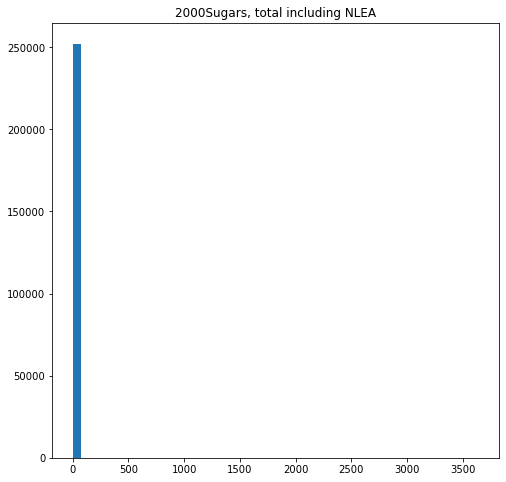

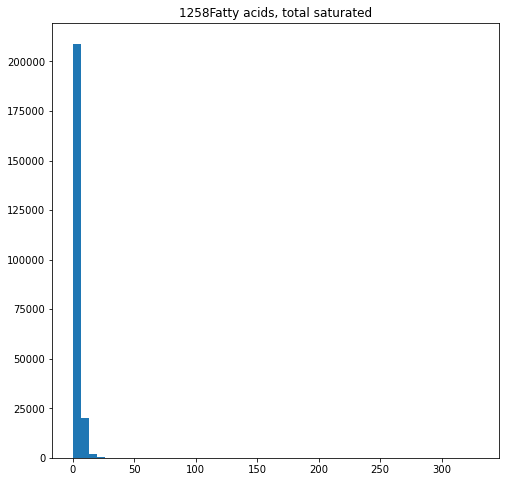

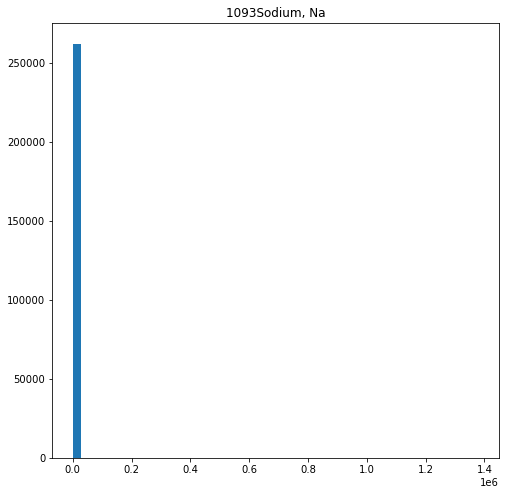

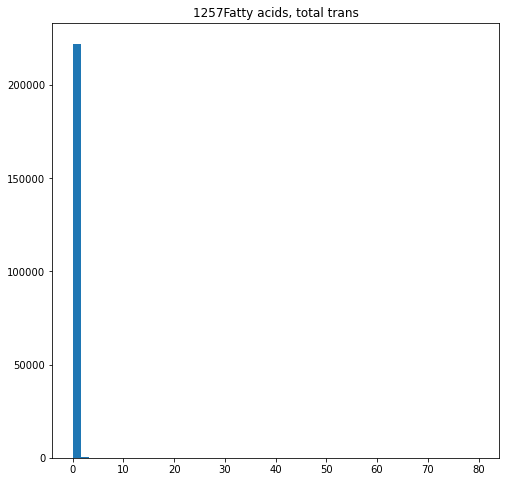

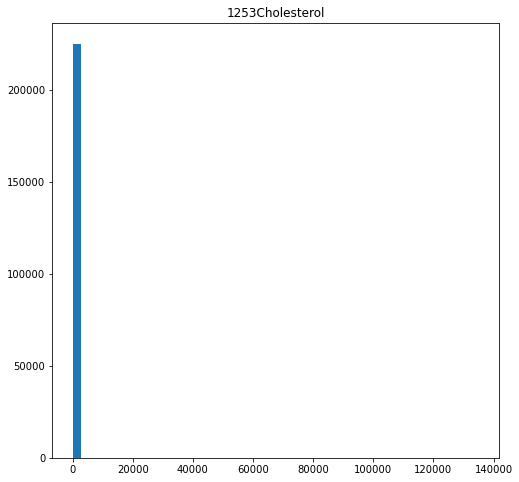

...

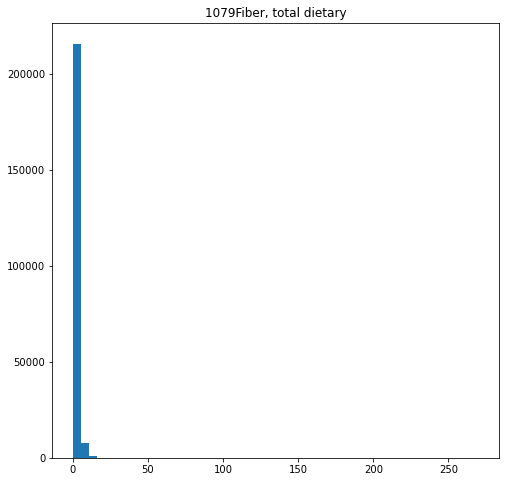

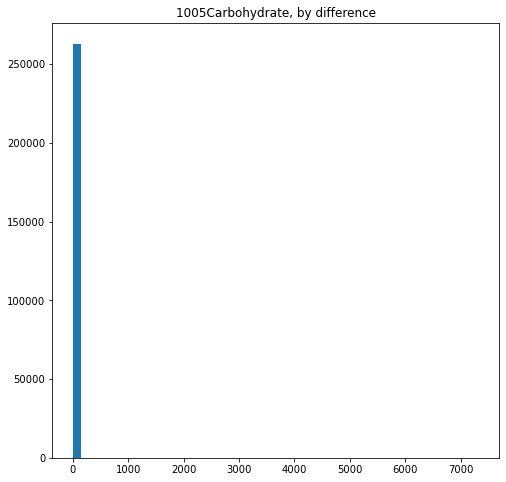

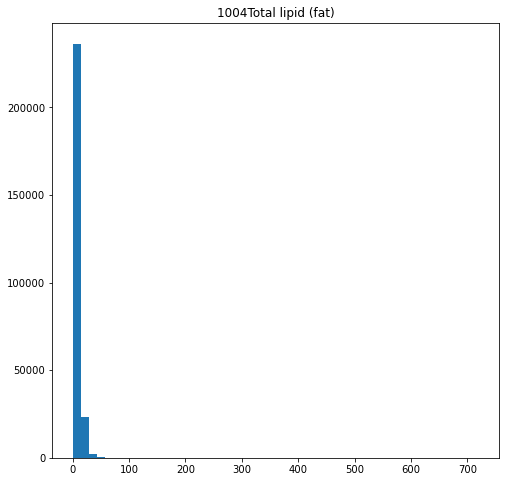

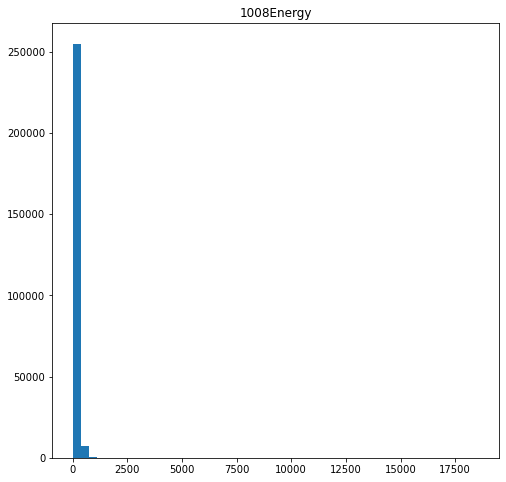

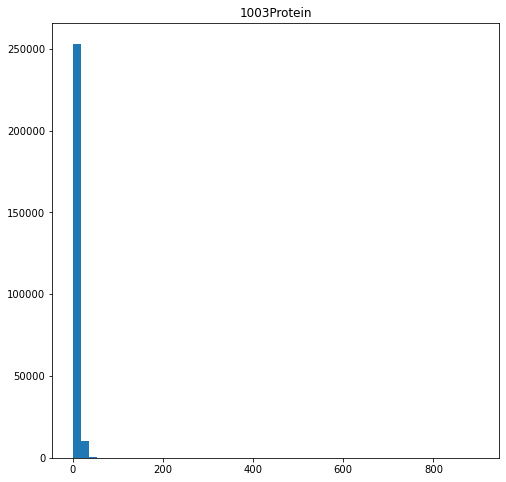

In [72]:
nutrients_small = list(set(nutrient_names) - set(col_remove))
for col in nutrients_small:
    plt.figure(figsize=(8,8))
    plt.hist(food_feature_df[col],bins=50)
    plt.title(f'{col}')
    plt.show()

Based on the above it seems we have some outliers in the numerical data. We should look at it more closely to see best way to take out.

In [73]:
food_feature_df[nutrients_small].describe()

,"2000Sugars, total including NLEA","1258Fatty acids, total saturated","1093Sodium, Na","1257Fatty acids, total trans",1253Cholesterol,"1089Iron, Fe","1087Calcium, Ca","1079Fiber, total dietary","1005Carbohydrate, by difference",1004Total lipid (fat),1008Energy,1003Protein
count,252658.000000,231617.000000,2.622800e+05,222780.000000,225267.000000,220507.000000,220914.000000,224975.000000,263298.000000,261787.000000,262920.000000,264249.000000
mean,9.341951,2.434288,4.138769e+02,0.021009,33.357276,3.492836,73.428263,1.519314,18.701960,5.849582,143.466416,4.730774
std,23.685859,3.952725,9.381753e+03,0.312316,1002.830008,658.308529,1358.597914,3.287142,34.732043,8.858258,213.345074,13.229026
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,3.528000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,4.999500,0.000000,69.940000,0.997100
50%,4.999500,1.496000,1.301350e+02,0.000000,0.000000,0.718200,20.140000,1.000000,16.998400,3.999000,129.200000,2.001000
75%,13.999600,3.502000,3.100800e+02,0.000000,19.840000,1.201200,60.480000,2.010000,26.000000,8.999500,180.180000,6.000400
max,3642.994500,330.012000,1.379999e+06,79.999400,134999.280000,300000.000300,460000.080000,270.000000,7325.007300,720.000000,18570.420000,900.018000


In [74]:
max_df = pd.DataFrame(columns=food_feature_df.columns)
for col in nutrients_small:
    index_max = food_feature_df[col].idxmax()
    max_df = pd.concat((max_df,food_feature_df.iloc[[index_max]]),ignore_index=True,axis=0)
    
max_df    

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
0,"94271010PC VEGGIE LOADED GYOZA, VEGGIE",8.9889,13.9938,7325.0073,18570.42,8.964,NaN,NaN,617861.13,NaN,...,0.9960,3642.9945,249.0,"Genji, Inc.","VEGGIE DUMPLING FILLING: CABBAGE, KALE, CARROT...",g,249 GRM,Other Deli,United States,"10PC VEGGIE LOADED GYOZA, VEGGIE"
1,"1063097MAYAN COCOA ORGANIC GOLD LABEL MACA, RE...",180.0000,510.0120,780.0120,7498.80,180.000,1198.80,216.0000,3751.20,NaN,...,330.0120,270.0000,360.0,REBBL,"ORGANIC COCONUT-MILK (WATER, ORGANIC COCONUT C...",ml,12 OZA,Other Drinks,United States,"MAYAN COCOA ORGANIC GOLD LABEL MACA, REISHI, M..."
2,808425FIREBRAISED PORK BURRITO,26.0100,58.0125,59.0070,540.60,2.040,349.35,4.4880,1379998.80,68.85,...,10.9905,4.9980,255.0,Cumberland Farms Dairy Inc,"FILLING: FIREBRAISED PORK SHOULDER: PORK, WATE...",g,1 BURRITO,Prepared Wraps and Burittos,United States,FIREBRAISED PORK BURRITO
3,1036465STICKY GRANOLA,1.9994,4.5006,4.9998,60.06,1.001,20.02,0.7202,40.04,0.00,...,0.5005,4.0001,13.0,"Base Culture, LLC","HONEY, ALMONDS, PUMPKIN SEEDS, PECANS, SUNFLOW...",g,1 Tbsp,Cereal,United States,STICKY GRANOLA
4,594676ROASTED CHICKEN IN SRIRACHA BBQ SAUCE WI...,39.9984,14.0088,33.0096,408.72,4.056,149.76,1.8096,480.48,134999.28,...,5.9904,12.0120,312.0,EAT FRESCO,ROASTED CHICKEN BREAST IN SRIRACHA BBQ SAUCE [...,g,11 ONZ,Cooked & Prepared,United States,ROASTED CHICKEN IN SRIRACHA BBQ SAUCE WITH MAC...
5,"1063613MINT CREME FILLED CHOCOLATE STICKS, MIN...",0.9984,11.0019,26.0013,200.07,1.014,0.00,300000.0003,0.00,0.00,...,7.0005,24.9990,39.0,LIDL,"SUGAR, COCOA BUTTER, CHOCOLATE LIQUOR, LACTOSE...",g,10 sticks,Chocolate,United States,"MINT CREME FILLED CHOCOLATE STICKS, MINT CREME"
6,"1044183CAFE LATTE PROTEIN POWDER, CAFE LATT",19.9989,0.0000,0.9990,8.10,NaN,460000.08,0.0999,69.93,9.99,...,0.0000,0.0000,27.0,"Be Well Nutrition, INC","INGREDIENTS: GRASS FED MILK PROTEIN ISOLATE, C...",g,1 Scoop,"Energy, Protein & Muscle Recovery Drinks",United States,"CAFE LATTE PROTEIN POWDER, CAFE LATT"
7,1059729REISHI COLD-BREW ORGANIC ENERGIZING ELI...,60.0120,330.0120,330.0120,4500.00,270.000,2998.80,21.6000,3150.00,NaN,...,270.0000,0.0000,360.0,"Rebbl, Inc.","ORGANIC COCONUT-MILK (WATER, ORGANIC COCONUT C...",ml,1 BOTTLE,Other Drinks,United States,REISHI COLD-BREW ORGANIC ENERGIZING ELIXIR COL...
8,"94271010PC VEGGIE LOADED GYOZA, VEGGIE",8.9889,13.9938,7325.0073,18570.42,8.964,NaN,NaN,617861.13,NaN,...,0.9960,3642.9945,249.0,"Genji, Inc.","VEGGIE DUMPLING FILLING: CABBAGE, KALE, CARROT...",g,249 GRM,Other Deli,United States,"10PC VEGGIE LOADED GYOZA, VEGGIE"
9,"922616PARMESAN & PEPPERCORN DRESSING, PARMESAN...",30.0015,720.0000,90.0000,6899.85,NaN,NaN,NaN,12299.85,300.15,...,120.0015,59.9985,45.0,Price Chopper Supermarkets,"SOYBEAN OIL, WATER, DISTILLED VINEGAR, HIGH FR...",ml,1.5 OZA,Salad Dressing & Mayonnaise,United States,"PARMESAN & PEPPERCORN DRESSING, PARMESAN & PEP..."


from the entry - pork braised burrito - it looks like the sodium was in wrong units. Not all entries are clear though. The Mint creme filled chocolate sticks entry is correct. The entry - rebbl cocoa drink does not seem to be right at all. Given the mix, I will look at the distribution of data to see what is the values of different percentiles and see if we can filter out a certain percentile of data.

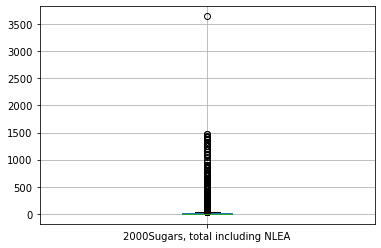

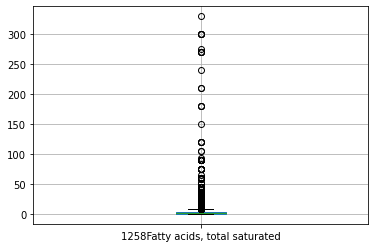

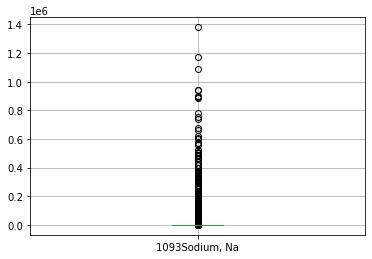

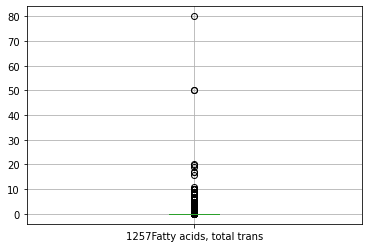

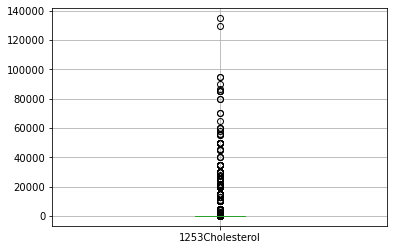

...

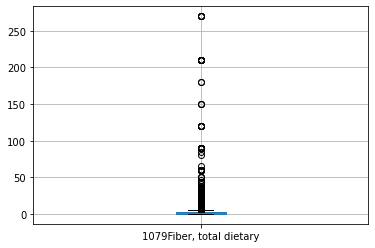

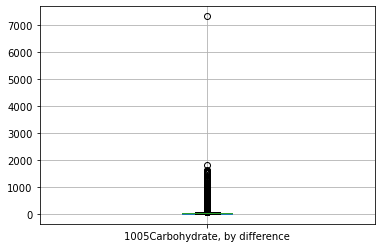

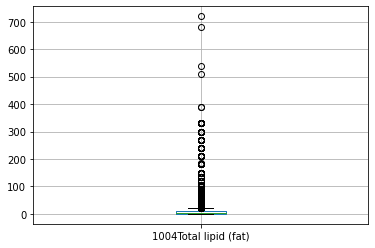

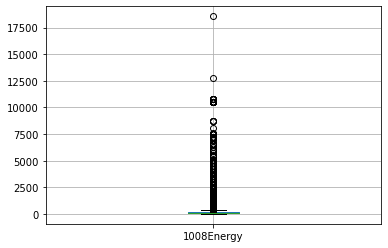

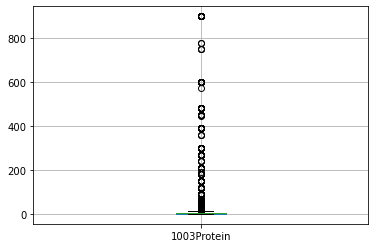

In [75]:
for column in nutrients_small:
    plt.figure()
    food_feature_df.boxplot([column])

Since data has many zeroes the above (box plots) is not a good method for removing outliers

In [76]:
for col in nutrients_small:
    print(col, food_feature_df[col].max(),food_feature_df[col].quantile(0.99)) #print max value of each column and value in 99th percentile

2000Sugars, total including NLEA 3642.9945000000002 43.992
1258Fatty acids, total saturated 330.012 13.989500000000001
1093Sodium, Na 1379998.8 1190.0888999999993
1257Fatty acids, total trans 79.9994 0.51
1253Cholesterol 134999.28 130.05
1089Iron, Fe 300000.0003 6.3
1087Calcium, Ca 460000.08 399.96000000000004
1079Fiber, total dietary 270.0 9.0
1005Carbohydrate, by difference 7325.0073 63.00200000000001
1004Total lipid (fat) 720.0 28.0
1008Energy 18570.420000000002 489.6
1003Protein 900.018 25.994519999999987


Given that the 99th percentile is so far from max, I will strip out rows above the 99th percentile

In [77]:
print('shape before take out top percentile:', food_feature_df.shape)
food_df_rem_outliers = food_feature_df[~(food_feature_df[nutrients_small]> food_feature_df[nutrients_small].quantile(0.99)).any(axis=1)]
print("shape after", food_df_rem_outliers.shape)
shape_before = food_feature_df.shape[0]
shape_after = food_df_rem_outliers.shape[0]
print("Number rows taken out: ", shape_before - shape_after)
print("Percent out: ", (shape_before - shape_after)*100 / shape_before)    

shape before take out top percentile: (291771, 21)
shape after (273546, 21)
Number rows taken out:  18225
Percent out:  6.246337024584348


Also create df with no nan values

In [78]:
food_df_rem_outliers.info(show_counts='all')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 273546 entries, 0 to 291770
Data columns (total 21 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   food_id_desc                      273546 non-null  object 
 1   1003Protein                       246300 non-null  float64
 2   1004Total lipid (fat)             244034 non-null  float64
 3   1005Carbohydrate, by difference   245925 non-null  float64
 4   1008Energy                        245882 non-null  float64
 5   1079Fiber, total dietary          209125 non-null  float64
 6   1087Calcium, Ca                   205568 non-null  float64
 7   1089Iron, Fe                      205158 non-null  float64
 8   1093Sodium, Na                    245097 non-null  float64
 9   1253Cholesterol                   209752 non-null  float64
 10  1257Fatty acids, total trans      207572 non-null  float64
 11  1258Fatty acids, total saturated  215198 non-null  f

If we look at a branded category that clearly has a nutrient

Now that we have cleaned out univariate outliers, let us run the numerical histograms again.

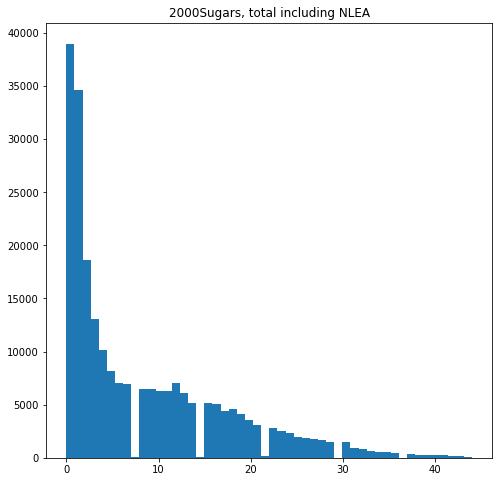

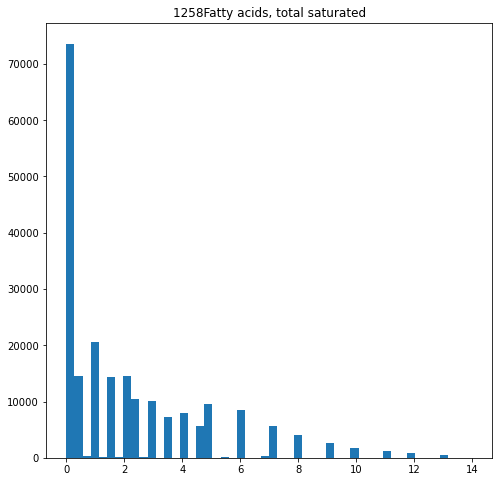

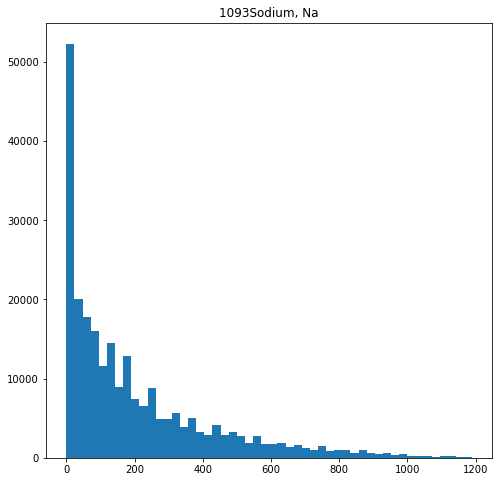

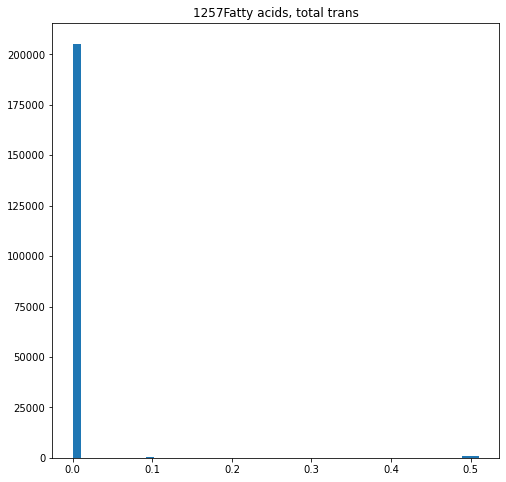

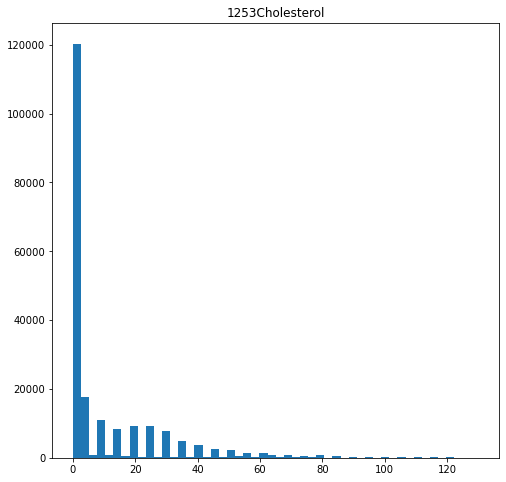

...

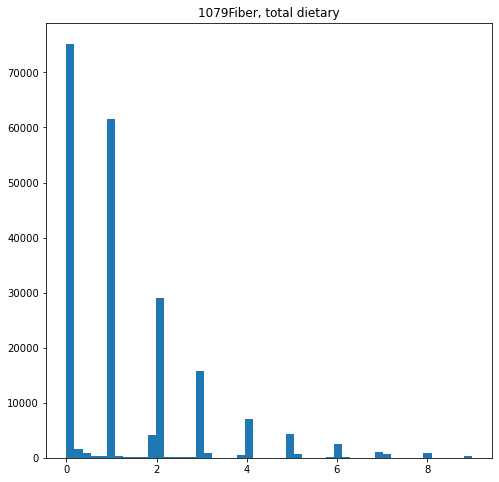

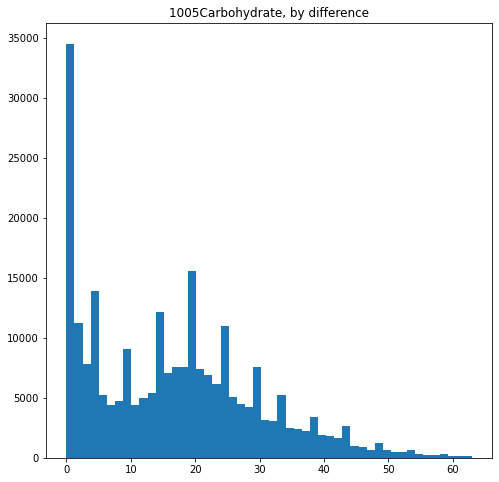

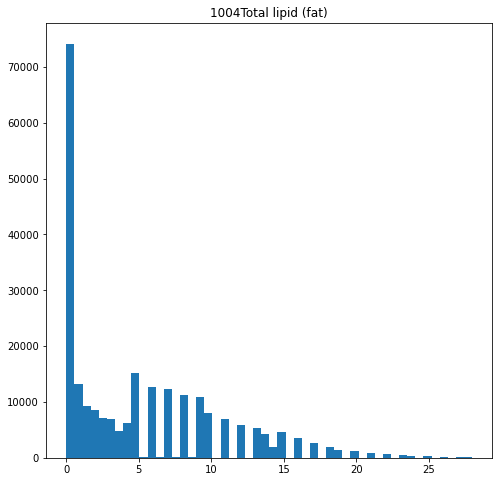

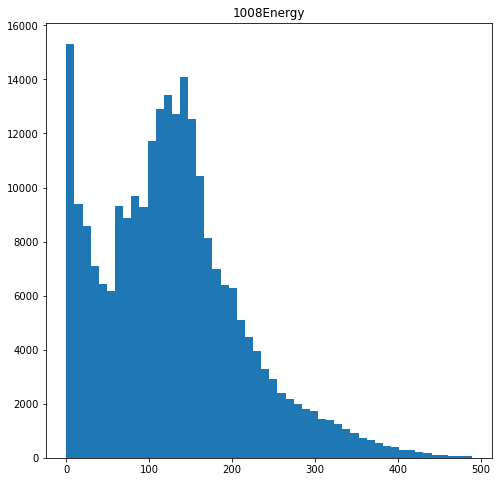

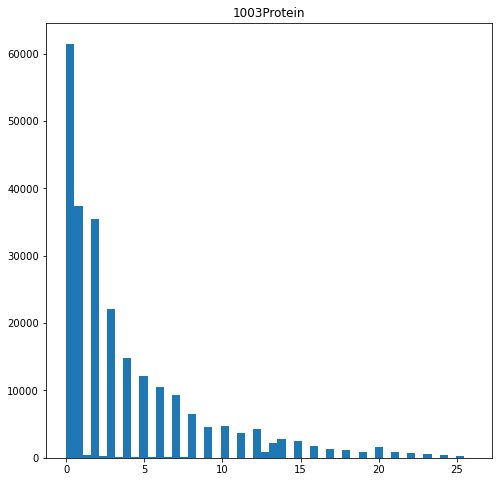

In [79]:
for col in nutrients_small:
    plt.figure(figsize=(8,8))
    plt.hist(food_df_rem_outliers[col],bins=50)
    plt.title(f'{col}')
    plt.show()

In [80]:
food_df_rem_outliers.describe()

,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,"1257Fatty acids, total trans","1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size
count,246300.000000,244034.000000,245925.000000,245882.000000,209125.000000,205568.000000,205158.000000,245097.000000,209752.000000,207572.000000,215198.000000,235420.000000,273546.000000
mean,3.912352,5.202075,16.807401,127.676714,1.324467,48.528395,0.811039,202.475212,10.718255,0.003778,2.156200,8.314822,77.644951
std,4.786421,5.526571,13.127799,86.009552,1.561040,70.014626,0.923723,222.650623,18.472678,0.041649,2.591013,8.961273,86.959131
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.648000,0.000000,4.995000,60.350000,0.000000,0.000000,0.000000,34.860000,0.000000,0.000000,0.000000,0.999900,28.000000
50%,2.000100,3.500200,16.000400,120.000000,0.999000,20.100000,0.710500,125.000000,0.000000,0.000000,1.003000,4.998400,42.000000
75%,5.996400,8.997500,25.000200,170.140000,2.000000,60.000000,1.080800,290.290000,15.120000,0.000000,3.499900,13.992000,100.000000
max,25.993500,28.000000,63.002000,489.600000,9.000000,399.960000,6.300000,1190.070000,130.050000,0.510000,13.989500,43.992000,9979.000000


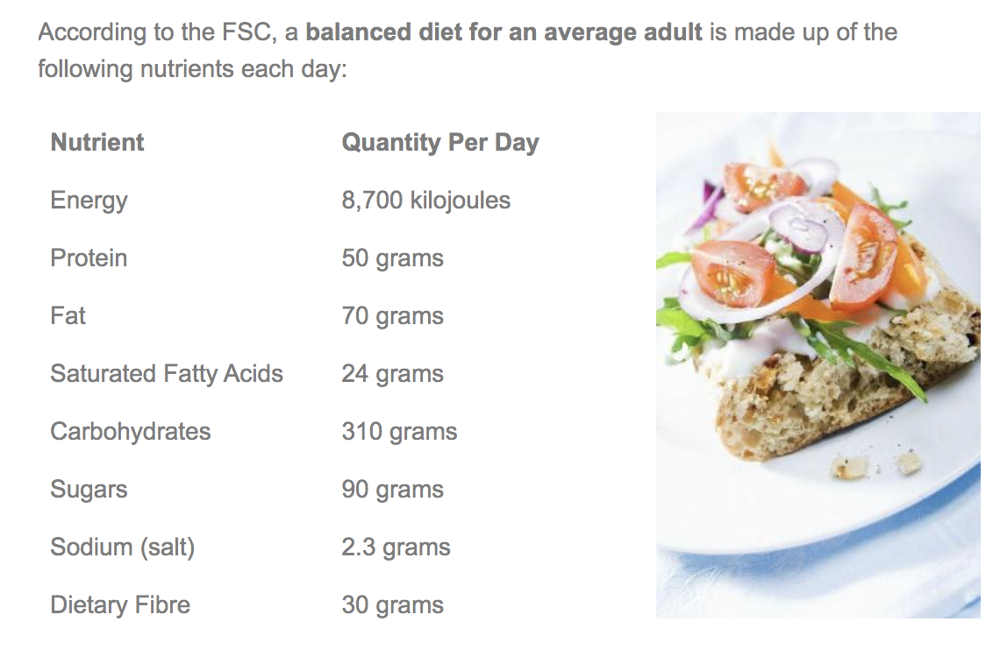

Max seems under the quantity per day so looks reasonable.

Let's now look at just data we have values for.

In [81]:
print(nutrients_small)
food_df_no_nans = drop_nan_row(nutrients_small, food_df_rem_outliers.copy())

['2000Sugars, total including NLEA', '1258Fatty acids, total saturated', '1093Sodium, Na', '1257Fatty acids, total trans', '1253Cholesterol', '1089Iron, Fe', '1087Calcium, Ca', '1079Fiber, total dietary', '1005Carbohydrate, by difference', '1004Total lipid (fat)', '1008Energy', '1003Protein']
<class 'pandas.core.frame.DataFrame'>
Int64Index: 173999 entries, 3 to 291766
Data columns (total 21 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   food_id_desc                      173999 non-null  object 
 1   1003Protein                       173999 non-null  float64
 2   1004Total lipid (fat)             173999 non-null  float64
 3   1005Carbohydrate, by difference   173999 non-null  float64
 4   1008Energy                        173999 non-null  float64
 5   1079Fiber, total dietary          173999 non-null  float64
 6   1087Calcium, Ca                   173999 non-null  float64
 7   1089Iron, Fe  

The dataframe is half of the size after removing nan rows and outliers. We will see what results we can get with this smaller data.

In [82]:
def run_corr(data,title=None,xlabel=None,ylabel=None):
    plt.figure( figsize = (10,10))
    correlation = data.corr()
    sns.heatmap(correlation, cmap=sns.color_palette("Spectral", as_cmap=True), annot=True)
    plt.title(title)
    plt.xlabel("{}".format(xlabel))
    plt.ylabel("{}".format(ylabel))
    plt.show()

In [83]:
food_df_no_nans.head()

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
3,1000709PREMIUM GROUND VEAL,20.0032,17.0016,0.0000,239.68,0.000,20.16,1.0752,85.12,89.60,...,7.9968,0.0000,112.0,"Marcho Farms, Inc.",VEAL,g,4 ONZ,Other Meats,United States,PREMIUM GROUND VEAL
7,"1000733CRACKED PEPPER WATER CRACKERS, CRACKED ...",3.0000,2.0010,23.0010,120.00,0.990,9.90,0.5010,189.90,0.00,...,0.0000,0.0000,30.0,"Safeway, Inc.","INGREDIENTS: UNBLEACHED WHEAT FLOUR, OLIVE OIL...",g,8 crackers,Crackers & Biscotti,United States,"CRACKED PEPPER WATER CRACKERS, CRACKED PEPPER"
9,1000739ORIGINAL RICH CHOCOLATE ROYALE MEAL REP...,1.9994,3.9988,17.9998,109.98,4.004,199.94,5.4002,130.00,4.94,...,0.4992,9.9996,26.0,KSF Acquisition Corporation,"INGREDIENTS: SUGAR, COCOA (PROCESSED WITH ALKA...",g,1/4 cup,Meal Replacement Supplements,United States,ORIGINAL RICH CHOCOLATE ROYALE MEAL REPLACEMEN...
10,1000741ORIGINAL FRENCH VANILLA MEAL REPLACEMEN...,1.9994,3.4996,17.9998,109.98,4.004,199.94,5.4002,139.88,4.94,...,0.4992,11.0006,26.0,KSF Acquisition Corporation,"SUGAR, HIGH OLEIC SUNFLOWER OIL, MALTODEXTRIN,...",g,1/4 cup,Powdered Drinks,United States,ORIGINAL FRENCH VANILLA MEAL REPLACEMENT SHAKE...
12,"1000775KETTLE CORN MICROWAVE POPCORN, KETTLE CORN",1.9998,7.9992,15.9984,139.92,3.993,0.00,0.9999,250.14,0.00,...,2.9997,0.0000,33.0,Raley's,"INGREDIENTS: POPCORN, PALM OIL, SALT, NATURAL ...",g,3 tbsp,"Popcorn, Peanuts, Seeds & Related Snacks",United States,"KETTLE CORN MICROWAVE POPCORN, KETTLE CORN"


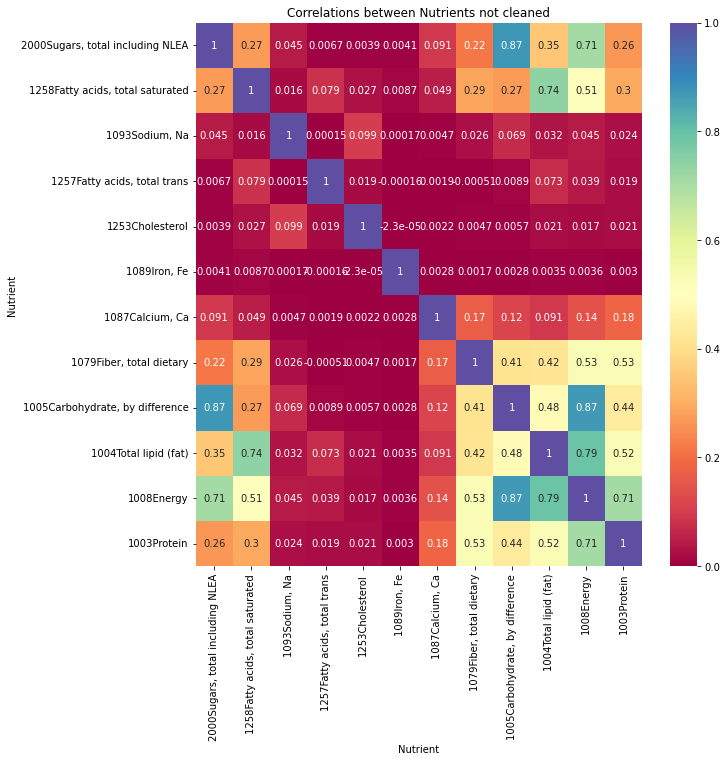

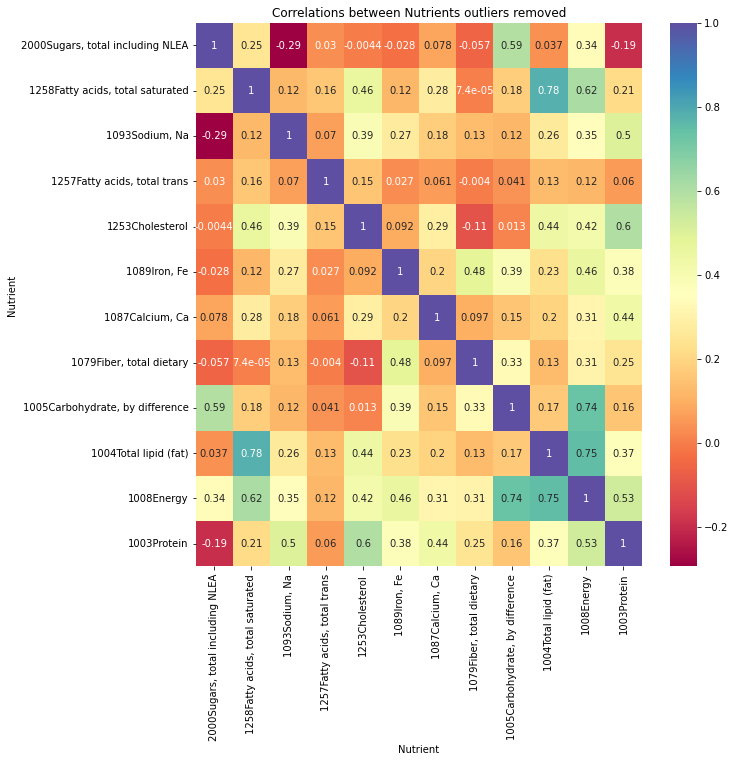

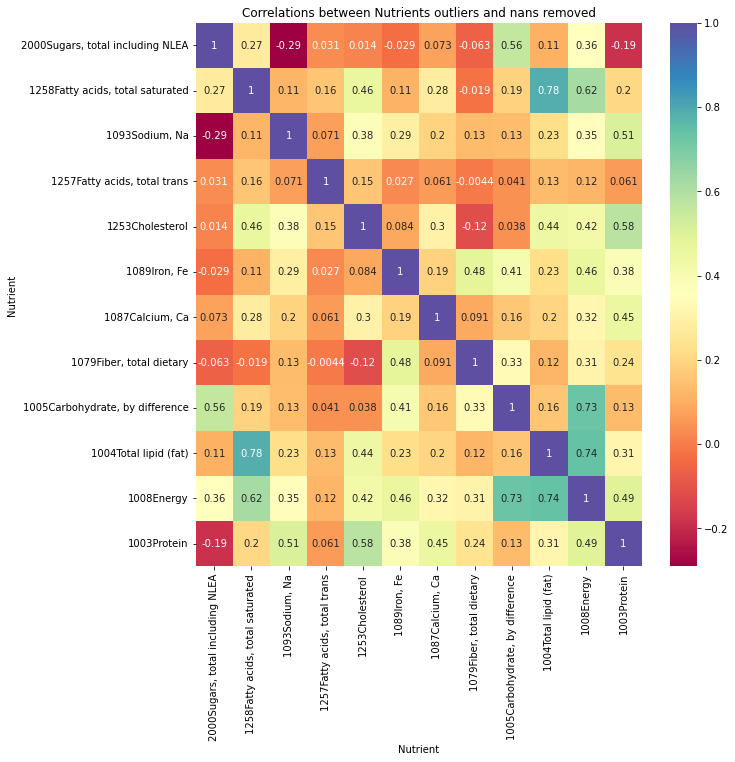

In [606]:
dfs = [food_feature_df[nutrients_small], food_df_rem_outliers[nutrients_small],food_df_no_nans[nutrients_small]]
titles = ['not cleaned', 'outliers removed', 'outliers and nans removed']
for df,title in zip(dfs,titles):
    run_corr(df,title="Correlations between Nutrients {}".format(title), xlabel="Nutrient",ylabel="Nutrient")

From the last two correlation matrices we see that the two types of fat have the highest correlation as expected since the saturated fat is part of the total lipid count. The second highest is fat and energy - as expected since there are 9g of fat in one calorie. followed by carbs with energy then saturated fat with energy. Interestingly, sugar and sodium are somewhat negatively correlated.

Going to do a linear regression with Energy, carbs, fat and protein. We should get coefficients roughly equal to equation 9, 4 and 4 for fat, carbs and protein given that this is the standard equation for computing energy.

In [85]:
def linear_reg(X_train, Y_train,X_test=None, y_test=None):
    """Runs linear regression, finding coefficients on x variables to predict the Y variable.
    X: a dataframe
    Y: dataframe
    X_test= dataframe or none. If none will just use X_train to predict
    Y_test = dataframe
    Output: return the model object"""
    model=LinearRegression()
    model.fit(X_train,Y_train)
    
    if X_test is not None:
        y_pred = model.predict(X_test)
    else:
        #X_test is None
        y_pred = model.predict(X_train)
        
    coef = model.coef_
    intercept = model.intercept_
    print("Coefficeints: {} and intercept: {}".format(coef,intercept))
    
    if y_test is None:
        y_test = Y_train
    #error distribution
    plt.figure()
    sns.histplot((y_test - y_pred),bins=100)
    print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
    print("MSE:", metrics.mean_squared_error(y_test,y_pred))
    print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
    plt.title("Histogram of Errors: True versus Predicted")
    plt.xlabel("Error")
    plt.ylabel("Count")
    plt.xlim(-70,70)
    print("R Squared:", round(model.score(X_test,y_test),2))

    return model

In [86]:
r=re.compile(".*Protein|.*lipid|.*Carbohydrate") #get the variable names by regex match
X_cols = list(filter(r.match, nutrients_small)) 
print("Independent variables: ", X_cols)
X = food_df_no_nans[X_cols]

Independent variables:  ['1005Carbohydrate, by difference', '1004Total lipid (fat)', '1003Protein']


In [87]:
r=re.compile(".*Energy")
Y_col = list(filter(r.match, nutrients_small)) 
print("Dependent variable: ", Y_col)
Y = food_df_no_nans[Y_col]

Dependent variable:  ['1008Energy']


In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

Coefficeints: [[3.96595295 8.72348798 4.09055592]] and intercept: [0.09684496]
MAE: 5.214908221140514
MSE: 89.84235947585029
RMSE: 9.478520954022853
R Squared: 0.99


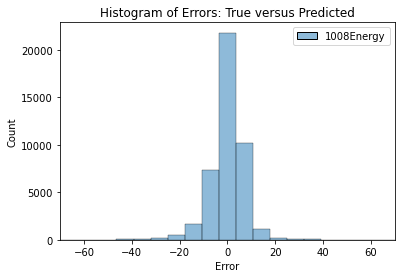

In [89]:
model_linear_reg = linear_reg(X_train, y_train, X_test, y_test)

The model seems to have performed well with a 0.99 R Squared. Our error distribution is normally distributed.

In [90]:
def plot_3d(X, Y,title): 
    """Plot in 3d where there are 3 independent variable features are along the three axes 
    and the color map according the y values. 
    X: DF where first three columns are the three independent variables 
    Y: DF of n x 1 where n is the number of rows in X. These are the color labeling  
    title: string type which is the title of the plot"""
    fig = plt.figure(figsize=(10,5))

    ax = fig.add_subplot(projection='3d')
    img = ax.scatter(X.iloc[:,0], X.iloc[:,1], X.iloc[:,2], c=Y, cmap=plt.hot())
    plt.title("{}".format(title))
    
    fig.colorbar(img)

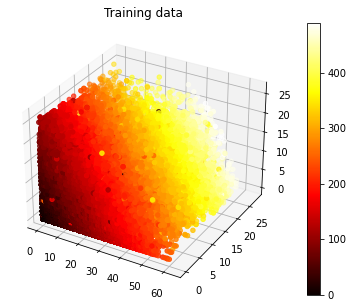

In [91]:
plot_3d(X_train, y_train, "Training data")

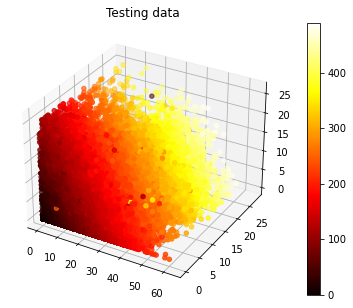

In [92]:
plot_3d(X_test, y_test, "Testing data")

In [93]:
y_pred = model_linear_reg.predict(X_test)

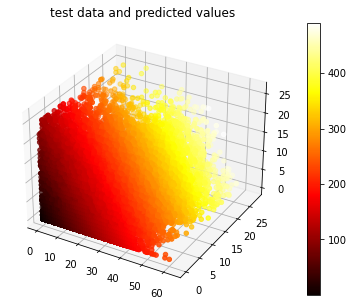

In [94]:
plot_3d(X_test, y_pred, "test data and predicted values")

From the above graphs, we see our model predicted a linear relationship in x and y (third graph with smooth coloring). From the second graph, we see that the reality is a bit more nuanced (i.e. the coloring is not totally linear).

Using this model, we could now add data that we had previously taken out because we did not have one of the three values. Let's see if in the original data any of the values are NaN

In [95]:
#use our data with outliers but has Nan's to get the data which has just one nan in any one of of carbs, fat, protein or energy
food_df_impute_values = food_df_rem_outliers.copy() #create copy to assign data to

food_df_impute_values['count_null_nutrients'] = food_df_rem_outliers[nutrients_small].isnull().sum(axis=1) #count nans

one_nan = food_df_impute_values[food_df_impute_values['count_null_nutrients']==1]

In [96]:
col_to_nans = {col:pd.DataFrame(columns=one_nan.columns) for col in nutrients_small} # dictionary of column names to dataframes with the rows that are missing that value
for col in nutrients_small:
    #get the rows in one_nan where that col is nan and add it to the dataframe dictionary
    col_to_nans[col] = one_nan[one_nan[col].isnull()]

In [97]:
for col in X_cols:
    print("number of NaN rows in {} is {}".format(col,col_to_nans[col].shape[0]))

number of NaN rows in 1005Carbohydrate, by difference is 67
number of NaN rows in 1004Total lipid (fat) is 157
number of NaN rows in 1003Protein is 216


In [98]:
for col in Y_col:
    print("number of NaN rows in {} is {}".format(col,col_to_nans[col].shape[0]))

number of NaN rows in 1008Energy is 4241


From the above we see that we could add 4,681 rows to our data just from imputing the values for these four "nutrients"

In [99]:
coefs = model_linear_reg.coef_ #get coefficients for fat, carbs and protein
intercept = model_linear_reg.intercept_
energy_nan = col_to_nans['1008Energy'].copy()

values = np.dot(energy_nan[X_cols],coefs.T)+intercept #apply function
energy_nan.loc[(pd.isnull(energy_nan['1008Energy'])), '1008Energy'] = values

In [100]:
def impute_nans(nan_df, impute_col, coeff_cols, coeffs,intercept):
    """imputes the nan column in a dataframe with one column of nans using the coefficients and intercept provided
    nan_df: dataframe where the dataframe has one column with nans
    impute_col: string of the column name with the nan values
    coeff_cols: list of strings where strings are the names of the columns we have coeffs for
    coeffs: ndarray of 1*m where m is number of coeffs and each item is a coefficient
    intercept: int type"""

    values = np.dot(nan_df[coeff_cols],coeffs.T)-intercept #apply function
    nan_df.loc[(pd.isnull(nan_df[impute_col])), impute_col] = values
    return nan_df

In [101]:
coefs = model_linear_reg.coef_ #get coefficients for fat, carbs and protein

L = coefs[0,0] #coeff on Lipids
C = coefs[0,1] #coeff on Carbs
P = coefs[0,2] #coeff on Protein
E = 1.0 #coeff on Energy
i = intercept[0] #intercept

#coeff for imputing lipids, carbs and protein
impute_L = np.array([-1*C, -1*P, E], dtype=np.int64)
impute_C = np.array([-1*L, -1*P, E],dtype=np.int64)
impute_P = np.array([-1*L,-1*C,E],dtype=np.int64)

impute_ls = [impute_L, impute_C,impute_P] #list of coefficients for calcing the imputed values

new_dfs = []
for cf,st in zip(impute_ls,X_cols):
    nan_df = col_to_nans[st].copy() #get df
    impute_col = st# get impute_col
    
    #get coeff_cols:
    coeff_cols = X_cols[:] #make a copy of list so as to not modify original
    coeff_cols.remove(st) #remove the one we want to impute
    coeff_cols.append(Y_col[0])

    new_dfs.append(impute_nans(nan_df,impute_col,coeff_cols,cf,intercept))

new_dfs[2].head()

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description,count_null_nutrients
541,"1005187SOUP, CHICKEN NOODLE",37.859755,1.9926,12.0042,89.91,0.972,19.44,0.729,388.80,19.44,...,1.9926,243.0,"Conagra Brands, Inc.","CHICKEN BROTH, COOKED CHICKEN (WHITE MEAT CHIC...",g,1 cup,Canned Soup,United States,"SOUP, CHICKEN NOODLE",1
1108,1013069ORGANIC MANGO CHUNKS,23.512755,0.0000,18.9968,80.60,1.984,0.00,0.000,0.00,0.00,...,17.0004,124.0,"Wal-Mart Stores, Inc.",INGREDIENTS: ORGANIC MANGO CHUNKS.,g,3/4 cup,Frozen Fruit & Fruit Juice Concentrates,United States,ORGANIC MANGO CHUNKS,1
1110,"1013097TRIPLE BERRY BLEND OF BLUEBERRIES, BLAC...",-56.642845,0.9940,18.9980,8.40,7.000,29.40,0.798,0.00,0.00,...,11.0040,140.0,"Wal-Mart Stores, Inc.","INGREDIENTS: ORGANIC BLUEBERRIES, ORGANIC BLAC...",g,1 cup,Frozen Fruit & Fruit Juice Concentrates,United States,"TRIPLE BERRY BLEND OF BLUEBERRIES, BLACKBERRIE...",1
1145,1013985BEEF FRANKS,29.801155,8.0010,1.9980,99.90,0.000,0.00,0.720,499.95,25.20,...,0.0000,45.0,"Conagra Brands, Inc.","KOSHER BEEF, WATER, MODIFIED POTATO STARCH, CO...",g,1 FRANK,"Sausages, Hotdogs & Brats",United States,BEEF FRANKS,1
1415,1017223CHOCOLATE FLAVOR WITH REAL COCOA MARSHM...,18.891355,2.4992,16.9994,89.98,0.000,0.00,0.000,64.90,0.00,...,9.9990,22.0,"Post Consumer Brands, LLC","INGREDIENTS: RICE, SUGAR, CORN SYRUP, FRUCTOSE...",g,22 GRM,"Cakes, Cupcakes, Snack Cakes",United States,CHOCOLATE FLAVOR WITH REAL COCOA MARSHMALLOW C...,1


In [102]:
no_y_nan = food_df_rem_outliers[~food_df_rem_outliers.food_id_desc.isin(energy_nan.food_id_desc)].copy()
no_x_nan = no_y_nan[~(no_y_nan.food_id_desc.isin(new_dfs[0].food_id_desc) | 
                               no_y_nan.food_id_desc.isin(new_dfs[1].food_id_desc)|
                               no_y_nan.food_id_desc.isin(new_dfs[2].food_id_desc)
                              )]

In [103]:
no_x_nan

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
0,1000569VODKA SAUCE,3.0000,10.0000,10.0000,140.00,1.00,NaN,NaN,610.00,30.00,...,5.0000,9.0000,125.0,"Mizkan America, Inc.","TOMATO PUREE (WATER, TOMATO PASTE), DICED TOMA...",g,1/2 cup,Prepared Pasta & Pizza Sauces,United States,VODKA SAUCE
1,"1000705GLUTEN FREE! JALAPENO CHEESE PUFFS, JAL...",1.9992,9.9988,13.0004,150.08,NaN,29.96,NaN,190.12,NaN,...,1.5008,1.9992,28.0,"Post Consumer Brands, LLC","YELLOW CORN MEAL, EXPELLER PRESSED HIGH OLEIC ...",g,3/4 cup,Other Snacks,United States,"GLUTEN FREE! JALAPENO CHEESE PUFFS, JALAPENO C..."
2,"1000707PLAIN LOWFAT YOGURT, PLAIN",NaN,NaN,NaN,129.39,NaN,349.58,0.0000,NaN,NaN,...,NaN,NaN,227.0,"Darigold, Inc.","INGREDIENTS: LOWFAT MILK, MODIFIED CORN STARCH...",g,8 ONZ,Yogurt,United States,"PLAIN LOWFAT YOGURT, PLAIN"
3,1000709PREMIUM GROUND VEAL,20.0032,17.0016,0.0000,239.68,0.00,20.16,1.0752,85.12,89.60,...,7.9968,0.0000,112.0,"Marcho Farms, Inc.",VEAL,g,4 ONZ,Other Meats,United States,PREMIUM GROUND VEAL
4,1000717LAMB SEASONING,0.2600,3.2500,1.3600,7.00,0.50,NaN,NaN,1.40,0.00,...,0.0000,0.0100,2.0,Wildeats Enterprises,"GROUND BLACK PEPPER, GRANULATED GARLIC, PAPRIK...",g,0.25 tsp,"Seasoning Mixes, Salts, Marinades & Tenderizers",United States,LAMB SEASONING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291766,"999311BUTTER PECAN ICE CREAM, BUTTER PECAN",4.9980,21.0018,21.0018,289.68,1.02,99.96,0.0000,105.06,84.66,...,9.9960,17.0034,102.0,"The Haagen-Dazs Company, Inc.","INGREDIENTS: VANILLA ICE CREAM: CREAM, SKIM MI...",g,1/2 cup,Ice Cream & Frozen Yogurt,United States,"BUTTER PECAN ICE CREAM, BUTTER PECAN"
291767,999315CREAMY VANILLA BETWEEN TWO CHOCOLATEY WA...,1.9992,4.9980,41.0032,219.52,0.98,49.98,0.1960,180.32,4.90,...,3.4986,23.0006,98.0,Big Drum,"INGREDIENTS: DAIRY PRODUCT SOLIDS, SKIM MILK, ...",g,98 GRM,Ice Cream & Frozen Yogurt,United States,CREAMY VANILLA BETWEEN TWO CHOCOLATEY WAFERS F...
291768,"999319MERRY MIX CANDY, MERRY MIX",0.0000,0.0000,13.9995,NaN,NaN,NaN,NaN,0.00,NaN,...,0.0000,13.0005,15.0,Ferrara Candy Company,"INGREDIENTS: DEXTROSE, MALTODEXTRIN, MALIC ACI...",g,15 GRM,Candy,United States,"MERRY MIX CANDY, MERRY MIX"
291769,999321CHOCOLATE ICE CREAM BARS DIPPED IN FINE ...,NaN,NaN,NaN,269.88,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,78.0,"The Haagen-Dazs Company, Inc.","INGREDIENTS: CHOCOLATE ICE CREAM: CREAM, SKIM ...",g,1 Bar,Ice Cream & Frozen Yogurt,United States,CHOCOLATE ICE CREAM BARS DIPPED IN FINE DARK C...


In [104]:
df_ls = new_dfs[:]
df_ls.extend((no_x_nan,energy_nan)) # append dfs to list for input into concat function

data_post_impute = pd.concat(df_ls,axis=0,ignore_index=True) #this has nans but not less, also post outlier removal
data_post_impute.drop('count_null_nutrients',axis=1,inplace=True)

In [105]:
data_post_impute

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
0,1002835CREAMY CHOCOLATE HIGH PROTEIN MEAL REPL...,19.9875,9.0025,26.683155,178.750000,4.875,351.00,2.6975,188.50,6.50,...,1.4950,1.0075,325.0,KSF Acquisition Corporation,"INGREDIENTS: WATER, CALCIUM CASEINATE, MILK PR...",ml,11 OZA,Weight Control,United States,CREAMY CHOCOLATE HIGH PROTEIN MEAL REPLACEMENT...
1,"1007885CRUNCHY PEANUT BUTTER ENERGY BARS, CRUN...",11.0024,6.9972,159.675955,259.760000,4.012,199.92,1.8020,229.84,0.00,...,0.9996,18.9992,68.0,Clif Bar and Company,"INGREDIENTS: ORGANIC BROWN RICE SYRUP, ORGANIC...",g,68 GRM,"Snack, Energy & Granola Bars",United States,"CRUNCHY PEANUT BUTTER ENERGY BARS, CRUNCHY PEA..."
2,1038107RASPBERRY POMEGRANATE ALMONDMILK YOGURT...,4.9950,4.0050,67.883155,120.000000,3.000,40.50,0.7200,25.50,0.00,...,0.0000,7.9950,150.0,"Danone US, LLC","INGREDIENTS: ALMONDMILK (FILTERED WATER, ALMON...",g,1 cup,Yogurt,United States,"RASPBERRY POMEGRANATE ALMONDMILK YOGURT, RASPB..."
3,"1045225OVEN ROASTED CHICKEN BREAST, OVEN ROASTED",10.9984,1.0024,-2.269645,49.840000,0.000,0.00,0.0000,450.24,30.24,...,0.0000,1.0024,56.0,Nash Finch Company,"INGREDIENTS: CHICKEN BREAST MEAT. WATER, CONTA...",g,2 ONZ,"Pepperoni, Salami & Cold Cuts",United States,"OVEN ROASTED CHICKEN BREAST, OVEN ROASTED"
4,"1046737HONEY ROASTED NUTS, HONEY ROASTED",5.9985,13.9996,44.022355,180.110000,2.015,39.99,0.7998,150.04,0.00,...,2.4986,3.0008,31.0,"John B. Sanfilippo & Son, Inc.",INGREDIENTS: HONEY ROAST SESAME STICKS (FLOUR ...,g,1/4 cup,Other Snacks,United States,"HONEY ROASTED NUTS, HONEY ROASTED"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273541,986455CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE...,4.0040,11.0000,20.002400,191.762376,2.024,80.08,1.3992,50.16,39.60,...,6.9960,17.0016,88.0,"Big Y Foods, Inc.","INGREDIENTS: MILK, CREAM, SKIM MILK, SUGAR, CO...",g,2/3 cup,Ice Cream & Frozen Yogurt,United States,CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE CREAM...
273542,"987413HONEY WHEAT BREAD, HONEY WHEAT",2.9997,0.9990,11.998800,68.668726,0.999,156.87,0.9990,125.01,0.00,...,0.0000,2.0007,27.0,Schwebel Baking Company,"INGREDIENTS: ENRICHED FLOUR (WHEAT FLOUR, MALT...",g,1 Slices,Breads & Buns,United States,"HONEY WHEAT BREAD, HONEY WHEAT"
273543,"987917PEACH MANGO GREEK NONFAT YOGURT, PEACH M...",13.0050,0.0000,12.000000,100.885960,3.000,100.50,0.0000,55.50,4.50,...,0.0000,7.9950,150.0,"Danone US, LLC","INGREDIENTS: CULTURED GRADE A NON FAT MILK, WA...",g,1 cup,Yogurt,United States,"PEACH MANGO GREEK NONFAT YOGURT, PEACH MANGO"
273544,"995625STRAWBERRY BANANA FAT FREE YOGURT, STRAW...",15.0000,0.0000,10.005000,101.134543,0.000,100.50,0.0000,75.00,4.50,...,0.0000,7.0050,150.0,Yoplait USA,"PASTEURIZED GRADE A NONFAT MILK, FRUIT BLEND (...",g,150 GRM,Yogurt,United States,"STRAWBERRY BANANA FAT FREE YOGURT, STRAWBERRY ..."


In [106]:
#analysis_df_post_impute = data_post_impute[nutrients_small]
post_impute_post_nan = drop_nan_row(nutrients_small, data_post_impute.copy())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 178680 entries, 0 to 273545
Data columns (total 21 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   food_id_desc                      178680 non-null  object 
 1   1003Protein                       178680 non-null  float64
 2   1004Total lipid (fat)             178680 non-null  float64
 3   1005Carbohydrate, by difference   178680 non-null  float64
 4   1008Energy                        178680 non-null  float64
 5   1079Fiber, total dietary          178680 non-null  float64
 6   1087Calcium, Ca                   178680 non-null  float64
 7   1089Iron, Fe                      178680 non-null  float64
 8   1093Sodium, Na                    178680 non-null  float64
 9   1253Cholesterol                   178680 non-null  float64
 10  1257Fatty acids, total trans      178680 non-null  float64
 11  1258Fatty acids, total saturated  178680 non-null  f

In [107]:
post_impute_post_nan.describe()

,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,"1257Fatty acids, total trans","1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size
count,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000,178680.000000
mean,4.556460,6.001417,18.448662,143.662999,1.325879,49.280510,0.818551,223.309144,10.609927,0.003862,2.209809,8.006650,74.010862
std,5.045210,5.769069,12.990882,83.960022,1.550090,70.448522,0.927833,227.216243,18.292159,0.042193,2.612992,8.515137,70.858406
min,-56.642845,-37.352645,-2.269645,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000400,1.001000,7.002800,89.610000,0.000000,0.000000,0.000000,54.540000,0.000000,0.000000,0.000000,1.000000,28.300000
50%,2.998800,4.999500,18.000000,135.200000,0.999000,20.100000,0.716800,150.000000,0.000000,0.000000,1.488000,4.996600,45.000000
75%,6.001600,9.000300,26.000000,189.900000,2.000000,60.060000,1.081200,320.100000,15.120000,0.000000,3.500000,13.000400,99.000000
max,127.515955,231.599155,198.252355,559.636013,9.000000,399.960000,6.300000,1190.000000,130.050000,0.510000,13.989500,43.992000,3750.000000


In [108]:
post_impute_post_nan

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,"1258Fatty acids, total saturated","2000Sugars, total including NLEA",food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description
0,1002835CREAMY CHOCOLATE HIGH PROTEIN MEAL REPL...,19.9875,9.0025,26.683155,178.750000,4.875,351.00,2.6975,188.50,6.50,...,1.4950,1.0075,325.0,KSF Acquisition Corporation,"INGREDIENTS: WATER, CALCIUM CASEINATE, MILK PR...",ml,11 OZA,Weight Control,United States,CREAMY CHOCOLATE HIGH PROTEIN MEAL REPLACEMENT...
1,"1007885CRUNCHY PEANUT BUTTER ENERGY BARS, CRUN...",11.0024,6.9972,159.675955,259.760000,4.012,199.92,1.8020,229.84,0.00,...,0.9996,18.9992,68.0,Clif Bar and Company,"INGREDIENTS: ORGANIC BROWN RICE SYRUP, ORGANIC...",g,68 GRM,"Snack, Energy & Granola Bars",United States,"CRUNCHY PEANUT BUTTER ENERGY BARS, CRUNCHY PEA..."
2,1038107RASPBERRY POMEGRANATE ALMONDMILK YOGURT...,4.9950,4.0050,67.883155,120.000000,3.000,40.50,0.7200,25.50,0.00,...,0.0000,7.9950,150.0,"Danone US, LLC","INGREDIENTS: ALMONDMILK (FILTERED WATER, ALMON...",g,1 cup,Yogurt,United States,"RASPBERRY POMEGRANATE ALMONDMILK YOGURT, RASPB..."
3,"1045225OVEN ROASTED CHICKEN BREAST, OVEN ROASTED",10.9984,1.0024,-2.269645,49.840000,0.000,0.00,0.0000,450.24,30.24,...,0.0000,1.0024,56.0,Nash Finch Company,"INGREDIENTS: CHICKEN BREAST MEAT. WATER, CONTA...",g,2 ONZ,"Pepperoni, Salami & Cold Cuts",United States,"OVEN ROASTED CHICKEN BREAST, OVEN ROASTED"
4,"1046737HONEY ROASTED NUTS, HONEY ROASTED",5.9985,13.9996,44.022355,180.110000,2.015,39.99,0.7998,150.04,0.00,...,2.4986,3.0008,31.0,"John B. Sanfilippo & Son, Inc.",INGREDIENTS: HONEY ROAST SESAME STICKS (FLOUR ...,g,1/4 cup,Other Snacks,United States,"HONEY ROASTED NUTS, HONEY ROASTED"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273541,986455CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE...,4.0040,11.0000,20.002400,191.762376,2.024,80.08,1.3992,50.16,39.60,...,6.9960,17.0016,88.0,"Big Y Foods, Inc.","INGREDIENTS: MILK, CREAM, SKIM MILK, SUGAR, CO...",g,2/3 cup,Ice Cream & Frozen Yogurt,United States,CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE CREAM...
273542,"987413HONEY WHEAT BREAD, HONEY WHEAT",2.9997,0.9990,11.998800,68.668726,0.999,156.87,0.9990,125.01,0.00,...,0.0000,2.0007,27.0,Schwebel Baking Company,"INGREDIENTS: ENRICHED FLOUR (WHEAT FLOUR, MALT...",g,1 Slices,Breads & Buns,United States,"HONEY WHEAT BREAD, HONEY WHEAT"
273543,"987917PEACH MANGO GREEK NONFAT YOGURT, PEACH M...",13.0050,0.0000,12.000000,100.885960,3.000,100.50,0.0000,55.50,4.50,...,0.0000,7.9950,150.0,"Danone US, LLC","INGREDIENTS: CULTURED GRADE A NON FAT MILK, WA...",g,1 cup,Yogurt,United States,"PEACH MANGO GREEK NONFAT YOGURT, PEACH MANGO"
273544,"995625STRAWBERRY BANANA FAT FREE YOGURT, STRAW...",15.0000,0.0000,10.005000,101.134543,0.000,100.50,0.0000,75.00,4.50,...,0.0000,7.0050,150.0,Yoplait USA,"PASTEURIZED GRADE A NONFAT MILK, FRUIT BLEND (...",g,150 GRM,Yogurt,United States,"STRAWBERRY BANANA FAT FREE YOGURT, STRAWBERRY ..."


# PCA Analysis

In [109]:
#now we want to standardize data for pca
Xmean = post_impute_post_nan[nutrients_small].mean().values[:,np.newaxis].T
print(Xmean) #mean of each column
XStd = post_impute_post_nan[nutrients_small].std().values[:,np.newaxis].T
print(XStd) #std of each column
subset_norm = (post_impute_post_nan[nutrients_small] - Xmean) / XStd

[[8.00664989e+00 2.20980863e+00 2.23309144e+02 3.86191530e-03
  1.06099272e+01 8.18550768e-01 4.92805100e+01 1.32587860e+00
  1.84486619e+01 6.00141689e+00 1.43662999e+02 4.55645990e+00]]
[[8.51513692e+00 2.61299225e+00 2.27216243e+02 4.21929425e-02
  1.82921590e+01 9.27833402e-01 7.04485216e+01 1.55008962e+00
  1.29908816e+01 5.76906923e+00 8.39600224e+01 5.04520965e+00]]


In [110]:
r = post_impute_post_nan.drop(nutrients_small,axis=1)

subset_norm = subset_norm.join(r, how='outer')

In [111]:
subset_norm.describe()

,"2000Sugars, total including NLEA","1258Fatty acids, total saturated","1093Sodium, Na","1257Fatty acids, total trans",1253Cholesterol,"1089Iron, Fe","1087Calcium, Ca","1079Fiber, total dietary","1005Carbohydrate, by difference",1004Total lipid (fat),1008Energy,1003Protein,food_serving_size
count,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,1.786800e+05,178680.000000
mean,4.477022e-14,6.375116e-14,1.744000e-14,-3.449474e-14,2.769572e-14,-7.752938e-14,5.604340e-14,-2.217224e-13,-7.050467e-14,-1.036964e-14,4.106540e-14,1.325782e-13,74.010862
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,70.858406
min,-9.402843e-01,-8.457004e-01,-9.828045e-01,-9.152989e-02,-5.800260e-01,-8.822174e-01,-6.995251e-01,-8.553561e-01,-1.594835e+00,-7.514914e+00,-1.711088e+00,-1.213018e+01,0.000000
25%,-8.228464e-01,-8.457004e-01,-7.427688e-01,-9.152989e-02,-5.800260e-01,-8.822174e-01,-6.995251e-01,-8.553561e-01,-8.810689e-01,-8.667632e-01,-6.437945e-01,-7.048389e-01,28.300000
50%,-3.534940e-01,-2.762383e-01,-3.226404e-01,-9.152989e-02,-5.800260e-01,-1.096649e-01,-4.142104e-01,-2.108772e-01,-3.453668e-02,-1.736705e-01,-1.007980e-01,-3.087404e-01,45.000000
75%,5.864556e-01,4.937601e-01,4.259856e-01,-9.152989e-02,2.465577e-01,2.830780e-01,1.530123e-01,4.348919e-01,5.812799e-01,5.198210e-01,5.507026e-01,2.864381e-01,99.000000
max,4.226045e+00,4.508123e+00,4.254497e+00,1.199580e+01,6.529578e+00,5.907795e+00,4.977812e+00,4.950760e+00,1.384076e+01,3.910470e+01,4.954418e+00,2.437153e+01,3750.000000


In [112]:
def perform_pca(n_comp, data):
    """implement pca analysis
    n_comp: int, number of components
    data: nxm dataframe with n obs and m features
    returns: model and transformed data"""
    
    time_start = time.time()

    pca = PCA(n_components=n_comp)
    pca_result = pca.fit_transform(data)

    print('PCA done! Time elapsed: {} seconds'.format(time.time()-time_start))
    return(pca, pca_result)

In [113]:
def columns_by_variance(col_names_list,col, data, pca):
    """orders columns by order of most to least variance for a specific component
    col_names_list: list of strings for which you want to name each column i.e. 'pca-1' etc. 
    length is length of number components in pca
    col:str is the column from col_names_list that you want to show in order of variance
    data: df
    pca: pca model output by the perform_pca function
    returns the feature names in order of greatest to smallest coefficient for the specied principal comp"""
    
    feature_combo = pd.DataFrame(pca.components_,columns=data.columns,index = col_names_list)
    df = feature_combo.loc[[col],:] #dataframe of the one component with each coefficient on the variables
    t = df.values.tolist()
    t = np.argsort(t)[0] 
    largest_indices = t[::-1] #now sorted from feature of highest variance to least variance
    cols = df.columns
    cols_by_order = [cols[i] for i in largest_indices]
    return(cols_by_order)

In [114]:
pca_norm, pca_result_norm = perform_pca(len(nutrients_small), subset_norm[nutrients_small]) #12 columns of nutrients in data

PCA done! Time elapsed: 0.12420892715454102 seconds


Variance explained per principal component: [0.32525816 0.15443925 0.1419727  0.08157026 0.0787693  0.06549824
 0.04481597 0.04031663 0.02739313 0.02089423 0.01705002 0.00202212]


Text(0, 0.5, 'variance')

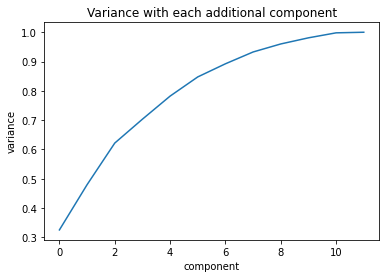

In [115]:
print('Variance explained per principal component: {}'.format(pca_norm.explained_variance_ratio_))
plt.plot(np.cumsum(pca_norm.explained_variance_ratio_))
plt.title("Variance with each additional component")
plt.xlabel("component")
plt.ylabel("variance")

In [116]:
names = ', '.join(['PC-%s']*len(nutrients_small))
x = [i for i in range(1,len(nutrients_small)+1)]
pca_names = names % tuple(x)
pca_names =  pca_names.split(',')

print("Columns in order of describing variance for PCA-1: ", 
      columns_by_variance(pca_names,
                          "PC-1",
                          subset_norm[nutrients_small],
                          pca_norm))

Columns in order of describing variance for PCA-1:  ['1008Energy', '1004Total lipid (fat)', '1258Fatty acids, total saturated', '1003Protein', '1253Cholesterol', '1005Carbohydrate, by difference', '1089Iron, Fe', '1087Calcium, Ca', '1093Sodium, Na', '1079Fiber, total dietary', '2000Sugars, total including NLEA', '1257Fatty acids, total trans']


In [117]:
data_labels = pd.DataFrame(subset_norm.food_id_desc.tolist())
pca_result_norm_df = pd.DataFrame(pca_result_norm)
pca_graph_data_norm = pd.concat([data_labels,pca_result_norm_df.iloc[:,0],pca_result_norm_df.iloc[:,1]], axis =1)

pca_graph_data_norm.columns= ["food","pca1","pca2"]
pca_graph_data_norm
output_notebook()
TOOLTIPS = [
    ("desc", "@food"),
]

p = figure(width=10000, height=400, tooltips=TOOLTIPS,
           title="Mouse over the dots")

p.circle('pca1', 'pca2', size=10, source=pca_graph_data_norm)

show(p)

Loading BokehJS ...

In the above we see Energy (calories) on x-axis and fat on y-axis. 

# Bivariate Analysis

I am interested to see if there are any relationships we can uncover between features and the number of ingredients in a food item

In [379]:
ing_df = drop_nan_row(['ingredients'],post_impute_post_nan)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 177937 entries, 0 to 273545
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   food_id_desc                      177937 non-null  object 
 1   1003Protein                       177937 non-null  float64
 2   1004Total lipid (fat)             177937 non-null  float64
 3   1005Carbohydrate, by difference   177937 non-null  float64
 4   1008Energy                        177937 non-null  float64
 5   1079Fiber, total dietary          177937 non-null  float64
 6   1087Calcium, Ca                   177937 non-null  float64
 7   1089Iron, Fe                      177937 non-null  float64
 8   1093Sodium, Na                    177937 non-null  float64
 9   1253Cholesterol                   177937 non-null  float64
 10  1257Fatty acids, total trans      177937 non-null  float64
 11  1258Fatty acids, total saturated  177937 non-null  f

In [380]:
#don't count the ingredients in between parenthesis
ing_df['ingredients_clean'] = ing_df['ingredients'].apply(lambda x: re.sub("\((.*?)\)","",x)) 

#count number of ingredients where each ingredient separated by two commas
ing_df['num_ingredients'] = ing_df['ingredients_clean'].apply(lambda x: len(x.split(',')))

In [381]:
ing_df.nunique()

food_id_desc                        177937
1003Protein                           4006
1004Total lipid (fat)                 4813
1005Carbohydrate, by difference       7174
1008Energy                            8996
1079Fiber, total dietary              2071
1087Calcium, Ca                       6021
1089Iron, Fe                          4791
1093Sodium, Na                       10688
1253Cholesterol                       2610
1257Fatty acids, total trans           342
1258Fatty acids, total saturated      3318
2000Sugars, total including NLEA      5129
food_serving_size                      861
brand_owner                          17632
ingredients                         177937
food_serving_size_unit                   2
household_serving_fulltext            9114
branded_food_category                  217
market_country                           1
description                         127584
ingredients_clean                   171010
num_ingredients                        100
dtype: int6

In [382]:
ing_df['num_ingredients'].max()

129

[Text(0.5, 1.0, 'number of ingredients in food')]

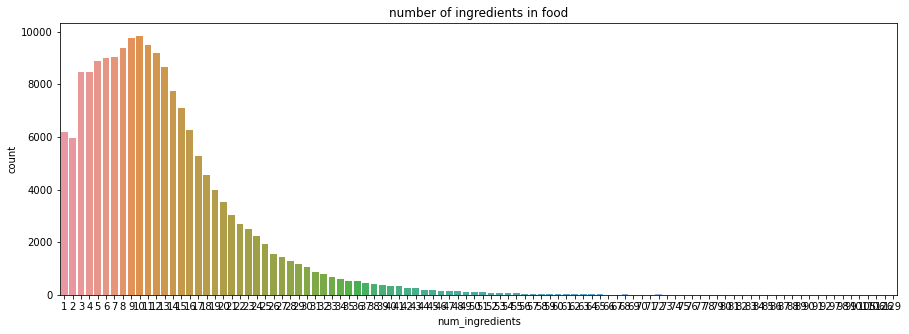

In [383]:
#what is the most number of ingredients
plt.figure(figsize=(15,5))
sns.countplot(x="num_ingredients",data=ing_df).set(title="number of ingredients in food")

In [384]:
#top n number of ingredients in food
n=1
print("the most frequent number of ingredients in a food is: ", ing_df["num_ingredients"].value_counts()[:n].index.tolist())

the most frequent number of ingredients in a food is:  [10]


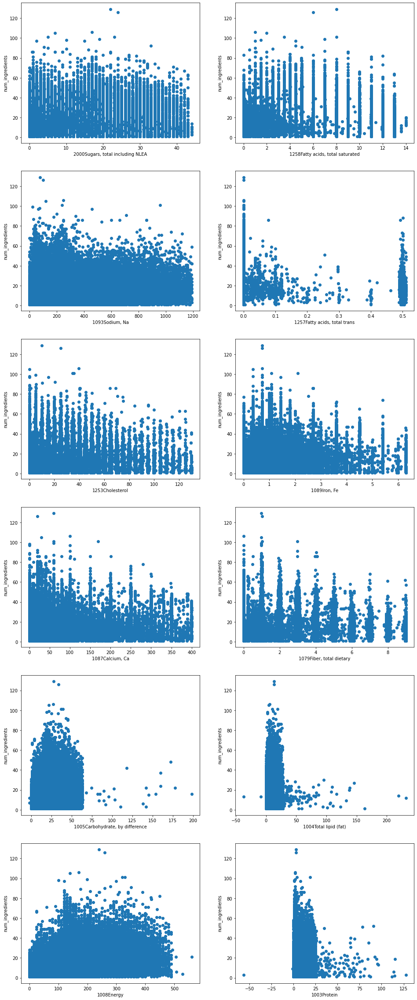

In [385]:
# now lets plot the graphs for continous variables
plt.figure(figsize=(16,48))
for idx,col in enumerate(nutrients_small):
    plt.subplot(7,2,idx+1)
    plt.scatter(x = ing_df[col],y=ing_df["num_ingredients"])
    plt.ylabel("num_ingredients")
    plt.xlabel(col)

<AxesSubplot:>

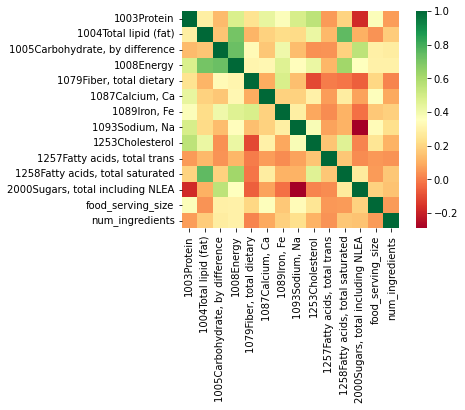

In [386]:
sns.heatmap(ing_df.corr(), square='True',cmap = 'RdYlGn')

In [387]:
#top n brand owners
def get_brand_owners(n,data):
    """get the top n brand owner
    n: int
    data: df with column 'brand_owner'
    return list of top n brands
    """
    return data["brand_owner"].value_counts()[:n].index.tolist()

In [388]:
#top n branded food category
n=5
top_brand_categories = ing_df["branded_food_category"].value_counts()[:n].index.tolist()
print("the most frequent brand food category: ", top_brand_categories)

the most frequent brand food category:  ['Popcorn, Peanuts, Seeds & Related Snacks', 'Ice Cream & Frozen Yogurt', 'Cookies & Biscuits', 'Breads & Buns', 'Candy']


In [389]:
#look at the top categories for top brand owners
bo_bf = ing_df.groupby(["brand_owner","branded_food_category"])["branded_food_category"].count().unstack()#count frquency for each brand owner, food cateogry pair

In [390]:
bo_bf

branded_food_category,"Chips, Pretzels & Snacks",Crackers & Biscotti,Canned Vegetables,Milk Additives,Nut & Seed Butters,"Oriental, Mexican & Ethnic Sauces",Other Drinks,Other Snacks,Pastry Shells & Fillings,"Popcorn, Peanuts, Seeds & Related Snacks",...,Antioxidant Supplements,Processed Cheese & Cheese Novelties,Herbal Supplements,Coffee/Tea/Substitutes,Kitchen Supplies,Children's Natural Remedies,Breakfast Foods,Fats Edible,Drinks,Grains
brand_owner,,,,,,,,,,,,,,,,,,,,,
ANCIENT IN GRAINED SNACK CO,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DOS HERMANOS S.A.,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NO MANUFACTURER,NaN,NaN,1.0,3.0,1.0,1.0,2.0,1.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
!QUE BUENO!,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""DIRTY""",1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
simply appetizers,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
the Brooklyn creamery company llc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
the GoodOnYa bar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [391]:
top_brand_owners = get_brand_owners(25, ing_df) #get top 25 brand owners and see which is their most popular category
bo_bf.loc[top_brand_owners].idxmax(axis=1) #top food cateogry in each of the top brand owners

brand_owner
Wal-Mart Stores, Inc.                     Cakes, Cupcakes, Snack Cakes
Target Stores                             Cakes, Cupcakes, Snack Cakes
Safeway, Inc.                                            Breads & Buns
Meijer, Inc.                  Popcorn, Peanuts, Seeds & Related Snacks
The Kroger Co.                               Ice Cream & Frozen Yogurt
Topco Associates, Inc.                       Ice Cream & Frozen Yogurt
Hy-Vee, Inc.                                 Ice Cream & Frozen Yogurt
Supervalu, Inc.                                          Breads & Buns
Wegmans Food Markets, Inc.    Popcorn, Peanuts, Seeds & Related Snacks
GENERAL MILLS SALES INC.                     Processed Cereal Products
Whole Foods Market, Inc.      Popcorn, Peanuts, Seeds & Related Snacks
NOT A BRANDED ITEM                        Cakes, Cupcakes, Snack Cakes
Giant Eagle, Inc.                            Ice Cream & Frozen Yogurt
Pinnacle Foods Group LLC                      Frozen Dinners & En

Now lets see which ingredient shows up most frequently in our data and which by food cateogory

In [392]:
#clean ingredients list 
#strip out spaces and punctuation
#take out items in between parens
ing_df['ingredients_clean'] = ing_df['ingredients_clean'].apply(lambda x: re.sub("\((.*?)\)","",x)) 

#take out other characters
ing_df['ingredients_clean'] = ing_df['ingredients_clean'].apply(lambda x: re.sub("[^,A-Za-z\s]+",'',x))

#make lowercase
ing_df['ingredients_clean'] = ing_df['ingredients_clean'].apply(lambda x: x.lower()) 
#strip out ingredients:
ing_df['ingredients_clean'] = ing_df['ingredients_clean'].apply(lambda x: x.replace("ingredients",'')) 

In [393]:
#counts and orders ingredients from most frequently found to least frequently found
start = time.time()
top_ing_s1 = pd.Series(''.join(x.strip() for x in ing_df['ingredients_clean']).split(","))
top_ing = top_ing_s1.apply(lambda x: x.strip()).value_counts()
top_ing = top_ing.drop('')
#top_in.value_counts()
end = time.time()
df = end-start
print(f"run time: {df}")

run time: 1.454491138458252


In [394]:
top_ing

salt                                                         90336
sugar                                                        65226
water                                                        54847
citric acid                                                  25951
corn syrup                                                   22131
                                                             ...  
basil paste  pasta soft wheat flour                              1
dried porcini mushroom pasta soft wheat flour                    1
durum wheat semolinapotato puree  water                          1
preservative potassium sorbatedough  topping tomato sauce        1
tomatoes parmesan cheese                                         1
Length: 192786, dtype: int64

From the above we see that salt is the most popular ingredient followed by sugar and then water. Citric acid is a food additive for preserving and adding acidity.

Now let us look at the most popular ingredient for each brand category

In [395]:
def func(x):
    """takes in a series,x which has strings of text which we want to count the occurrences of an returns list of all ingredients"""
    return x.str.split(",").value_counts().index.tolist()

In [396]:
ing_count_by_category = ing_df.groupby(['branded_food_category'])['ingredients_clean'].apply(func)

In [397]:
#iterate through each row which maps to list of ingredients, take each ingredient out and add it to a single list
n= len(ing_count_by_category) 
d={}
food_ing_df = pd.DataFrame(columns = ["branded_food_category","ing_list"])
for i in range(n):
    d[ing_count_by_category.index[i]] = []
    l = []
    for j in range(len(ing_count_by_category[i])):
        for k in range(len(ing_count_by_category[i][j])):
            trim_ends = ing_count_by_category[i][j][k].strip()
            l.append(trim_ends)
    d = {'branded_food_category':ing_count_by_category.index[i],'ing_list': l}
    food_ing_df = food_ing_df.append(d,ignore_index=True)

In [398]:
food_ing_df['max_ing'] = food_ing_df['ing_list'].apply(lambda x: max(set(x), key=x.count)) #gets most ocurring ingredient every category

In [399]:
food_ing_df

,branded_food_category,ing_list,max_ing
0,Alcohol,"[filtered water, pure cane sugar, blue agave n...",water
1,All Noodles,"[enriched durum flour, whole egg, ramen brown ...",salt
2,Antioxidant Supplements,"[organic chaga extract powder, organic cacao, ...",organic cinnamon
3,Baby/Infant Foods/Beverages,"[organic apple puree, organic cauliflower, wat...",water
4,"Bacon, Sausages & Ribs","[bacon, cured with water, salt, sugar, sodium ...",salt
...,...,...,...
212,Weight Control,"[soy protein isolate, cane sugar, maltodextrin...",soy lecithin
213,Wholesome Snacks,"[dried cranberries, dried cherries, dried blue...",sugar
214,Yogurt,"[grade a pasteurized whole milk, fruit puree, ...",pectin
215,Yogurt/Yogurt Substitutes,"[fat free yogurt, nitrogen, lactosefree low fa...",natural flavor


In [400]:
#just look at most frequent food brand categories
food_ing_df_trim = food_ing_df[food_ing_df['branded_food_category'].isin(top_brand_categories)].copy()

In [401]:
food_ing_df_trim

,branded_food_category,ing_list,max_ing
20,Breads & Buns,"[unbleached enriched flour, water, high fructo...",water
30,Candy,"[milk chocolate, sugar, cornstarch, less than ...",sugar
58,Cookies & Biscuits,"[cookie, icing, enriched flour, sugar, vegetab...",sugar
118,Ice Cream & Frozen Yogurt,"[ice cream wafers, reduced fat ice cream coa...",sugar
166,"Popcorn, Peanuts, Seeds & Related Snacks","[almonds, vegetable oil, sea salt, almonds, se...",salt


# Train word embedding using our ingredient list

In [559]:
tqdm.pandas()

In [560]:
ing_df['num_ingredients'].quantile(.95) #95% of data has 30 ingredients or less. We will use this as our cut off

30.0

In [561]:
word2vec_df = ing_df[ing_df['num_ingredients']<=30].copy()

In [562]:
word2vec_df.head()

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description,ingredients_clean,num_ingredients
1,"1007885CRUNCHY PEANUT BUTTER ENERGY BARS, CRUN...",11.0024,6.9972,159.675955,259.76,4.012,199.92,1.8020,229.84,0.00,...,68.0,Clif Bar and Company,"INGREDIENTS: ORGANIC BROWN RICE SYRUP, ORGANIC...",g,68 GRM,"Snack, Energy & Granola Bars",United States,"CRUNCHY PEANUT BUTTER ENERGY BARS, CRUNCHY PEA...","organic brown rice syrup, organic rolled oats...",24
2,1038107RASPBERRY POMEGRANATE ALMONDMILK YOGURT...,4.9950,4.0050,67.883155,120.00,3.000,40.50,0.7200,25.50,0.00,...,150.0,"Danone US, LLC","INGREDIENTS: ALMONDMILK (FILTERED WATER, ALMON...",g,1 cup,Yogurt,United States,"RASPBERRY POMEGRANATE ALMONDMILK YOGURT, RASPB...","almondmilk , cane sugar, tapioca starch, fava...",17
3,"1045225OVEN ROASTED CHICKEN BREAST, OVEN ROASTED",10.9984,1.0024,-2.269645,49.84,0.000,0.00,0.0000,450.24,30.24,...,56.0,Nash Finch Company,"INGREDIENTS: CHICKEN BREAST MEAT. WATER, CONTA...",g,2 ONZ,"Pepperoni, Salami & Cold Cuts",United States,"OVEN ROASTED CHICKEN BREAST, OVEN ROASTED","chicken breast meat water, contains or less ...",7
4,"1046737HONEY ROASTED NUTS, HONEY ROASTED",5.9985,13.9996,44.022355,180.11,2.015,39.99,0.7998,150.04,0.00,...,31.0,"John B. Sanfilippo & Son, Inc.",INGREDIENTS: HONEY ROAST SESAME STICKS (FLOUR ...,g,1/4 cup,Other Snacks,United States,"HONEY ROASTED NUTS, HONEY ROASTED","honey roast sesame sticks , honey roast peanu...",8
5,"1047269YELLOW CAKE LAYERS, YELLOW",4.9966,9.0042,177.923155,270.04,0.000,40.42,0.1978,470.42,19.78,...,86.0,"Bimbo Bakeries USA, Inc.","INGREDIENTS: WATER, SUGAR, WHEAT STARCH, ENRIC...",g,0.1 cake,Other Frozen Desserts,United States,"YELLOW CAKE LAYERS, YELLOW","water, sugar, wheat starch, enriched wheat fl...",22


In [563]:
word2vec_df.shape

(169532, 23)

In [564]:
word2vec_df['ing_list'] = word2vec_df.ingredients_clean.apply(lambda x: x.split(','))

In [565]:
word2vec_df.head()

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description,ingredients_clean,num_ingredients,ing_list
1,"1007885CRUNCHY PEANUT BUTTER ENERGY BARS, CRUN...",11.0024,6.9972,159.675955,259.76,4.012,199.92,1.8020,229.84,0.00,...,Clif Bar and Company,"INGREDIENTS: ORGANIC BROWN RICE SYRUP, ORGANIC...",g,68 GRM,"Snack, Energy & Granola Bars",United States,"CRUNCHY PEANUT BUTTER ENERGY BARS, CRUNCHY PEA...","organic brown rice syrup, organic rolled oats...",24,"[ organic brown rice syrup, organic rolled oa..."
2,1038107RASPBERRY POMEGRANATE ALMONDMILK YOGURT...,4.9950,4.0050,67.883155,120.00,3.000,40.50,0.7200,25.50,0.00,...,"Danone US, LLC","INGREDIENTS: ALMONDMILK (FILTERED WATER, ALMON...",g,1 cup,Yogurt,United States,"RASPBERRY POMEGRANATE ALMONDMILK YOGURT, RASPB...","almondmilk , cane sugar, tapioca starch, fava...",17,"[ almondmilk , cane sugar, tapioca starch, ..."
3,"1045225OVEN ROASTED CHICKEN BREAST, OVEN ROASTED",10.9984,1.0024,-2.269645,49.84,0.000,0.00,0.0000,450.24,30.24,...,Nash Finch Company,"INGREDIENTS: CHICKEN BREAST MEAT. WATER, CONTA...",g,2 ONZ,"Pepperoni, Salami & Cold Cuts",United States,"OVEN ROASTED CHICKEN BREAST, OVEN ROASTED","chicken breast meat water, contains or less ...",7,"[ chicken breast meat water, contains or les..."
4,"1046737HONEY ROASTED NUTS, HONEY ROASTED",5.9985,13.9996,44.022355,180.11,2.015,39.99,0.7998,150.04,0.00,...,"John B. Sanfilippo & Son, Inc.",INGREDIENTS: HONEY ROAST SESAME STICKS (FLOUR ...,g,1/4 cup,Other Snacks,United States,"HONEY ROASTED NUTS, HONEY ROASTED","honey roast sesame sticks , honey roast peanu...",8,"[ honey roast sesame sticks , honey roast pea..."
5,"1047269YELLOW CAKE LAYERS, YELLOW",4.9966,9.0042,177.923155,270.04,0.000,40.42,0.1978,470.42,19.78,...,"Bimbo Bakeries USA, Inc.","INGREDIENTS: WATER, SUGAR, WHEAT STARCH, ENRIC...",g,0.1 cake,Other Frozen Desserts,United States,"YELLOW CAKE LAYERS, YELLOW","water, sugar, wheat starch, enriched wheat fl...",22,"[ water, sugar, wheat starch, enriched whea..."


Now we want to take out ingredients that do not occur more than a certain number of times.

In [566]:
from scipy import stats
stats.percentileofscore(top_ing,5) #Ingredients that occur more than 5 times captures the 92nd percentile

92.0209455043416

In [567]:
def shorten_ing_list(list_keep, series):
    """takes out ingredients not in list_keep
    list_keep: list of ingredients to keep
    series: list of ingredients in food 
    returns: list after"""
    for ing in series:
        if ing not in list_keep:
            series.remove(ing)
    return series

In [568]:
word2vec_df['ing_list']

1         [ organic brown rice syrup,  organic rolled oa...
2         [ almondmilk ,  cane sugar,  tapioca starch,  ...
3         [ chicken breast meat water,  contains  or les...
4         [ honey roast sesame sticks ,  honey roast pea...
5         [ water,  sugar,  wheat starch,  enriched whea...
                                ...                        
273541    [ milk,  cream,  skim milk,  sugar,  corn syru...
273542    [ enriched flour ,  water,  yeast,  wheat glut...
273543    [ cultured grade a non fat milk,  water,  peac...
273544    [pasteurized grade a nonfat milk,  fruit blend...
273545    [ filling lowmoisture partskim mozzarella chee...
Name: ing_list, Length: 169532, dtype: object

In [569]:
word2vec_df['ing_list'] = word2vec_df.apply(lambda x: [y.strip() for y in x['ing_list']],axis=1)

In [570]:
word2vec_df['ing_list']

1         [organic brown rice syrup, organic rolled oats...
2         [almondmilk, cane sugar, tapioca starch, fava ...
3         [chicken breast meat water, contains  or less ...
4         [honey roast sesame sticks, honey roast peanut...
5         [water, sugar, wheat starch, enriched wheat fl...
                                ...                        
273541    [milk, cream, skim milk, sugar, corn syrup, co...
273542    [enriched flour, water, yeast, wheat gluten, w...
273543    [cultured grade a non fat milk, water, peaches...
273544    [pasteurized grade a nonfat milk, fruit blend ...
273545    [filling lowmoisture partskim mozzarella chees...
Name: ing_list, Length: 169532, dtype: object

In [571]:
list_keep = set(top_ing[top_ing>=5].index.values)
word2vec_df['ing_list_use'] = word2vec_df.apply(lambda x: shorten_ing_list(list_keep, x['ing_list']),axis=1)

In [572]:
word2vec_df_short = word2vec_df[word2vec_df['ing_list_use'].map(lambda d: len(d))>0]

(array([22487., 27058., 28904., 28189., 21875., 14603.,  9502.,  6680.,
         4210.,  1925.]),
 array([ 1. ,  3.9,  6.8,  9.7, 12.6, 15.5, 18.4, 21.3, 24.2, 27.1, 30. ]),
 <BarContainer object of 10 artists>)

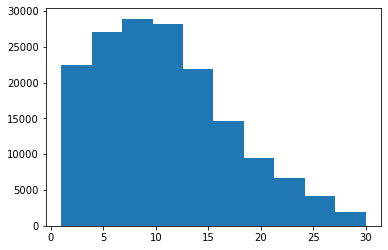

In [573]:
plt.hist(word2vec_df_short['ing_list_use'].apply(lambda x: len(x)))

In [574]:
sentences = []
for l in word2vec_df.ing_list_use:
    sentences.append(l)

In [576]:
train_sentences

array([[   3,   39,  230, ...,    0,    0,    0],
       [ 103, 3294,  797, ...,    0,    0,    0],
       [1064,  130,    3, ...,    0,    0,    0],
       ...,
       [   3,   45,  154, ...,    0,    0,    0],
       [   3,  107, 9011, ...,    0,    0,    0],
       [   2,  178,  185, ...,    0,    0,    0]], dtype=int32)

In [580]:
len(sentences)

169532

In [597]:
size_list =  max(len(elem) for elem in sentences)
start_time = time.time()

model_bow = Word2Vec(sentences=sentences, 
                 sg=0, 
                 size=50,
                     min_count=1,
                     window=size_list,
                 workers=4)

print(f'Time taken : {(time.time() - start_time) / 60:.2f} mins')

Time taken : 0.18 mins


In [598]:
model_bow.most_similar('sugar')

/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('caramel color', 0.6198891401290894),
 ('cane sugar', 0.6052901744842529),
 ('dextrose', 0.5650812387466431),
 ('contains less than  of the following cornstarch', 0.5304381251335144),
 ('eggs contains  or less of leavening', 0.5175124406814575),
 ('white confectionery chunks', 0.5095908641815186),
 ('contains  or less of unsweetened chocolate', 0.5075873136520386),
 ('contains  or less of sugar', 0.503776490688324),
 ('reduced minerals whey', 0.4908882975578308),
 ('sucrose', 0.48045122623443604)]

In [589]:
size_list =  max(len(elem) for elem in sentences)
start_time = time.time()

model_sg = Word2Vec(sentences=sentences, 
                 sg=1, 
                 size=50,
                    min_count=1,
                    window=size_list,
                 workers=4)

print(f'Time taken : {(time.time() - start_time) / 60:.2f} mins')

Time taken : 0.47 mins


In [585]:
model_sg.most_similar("sugar")

/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('dextrose', 0.8500162363052368),
 ('caramel color', 0.8380677103996277),
 ('salt', 0.824217677116394),
 ('soy lecithin', 0.7835297584533691),
 ('contains  or less of caramel color', 0.7719311118125916),
 ('sugar palm oil', 0.7646054029464722),
 ('slat', 0.7577659487724304),
 ('sugar soybean oil', 0.7570387721061707),
 ('contains  or less of the following yellow corn flour', 0.756217360496521),
 ('salt spices', 0.7506759762763977)]

In [492]:
vocab_words = list(model_sg.wv.vocab)                                                                      
print(len(vocab_words))

5171


In [599]:
def display_closestwords_tsnescatterplot(model, word, size):
    
    arr = np.empty((0,size), dtype='f')
    word_labels = [word]
    close_words = model.similar_by_word(word)
    arr = np.append(arr, np.array([model[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = model[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)
    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    plt.scatter(x_coords, y_coords)
    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).
  """
/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


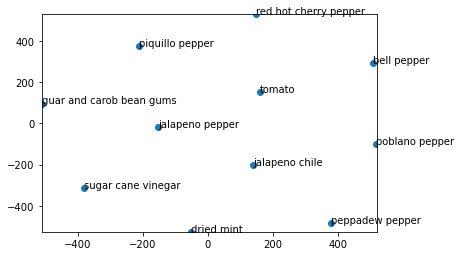

In [613]:
display_closestwords_tsnescatterplot(model_sg, 'tomato', 50) 

/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).
  """
/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


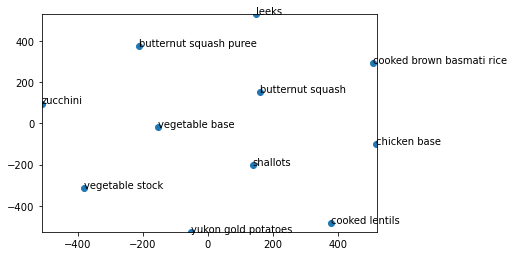

In [625]:
display_closestwords_tsnescatterplot(model_bow, 'butternut squash', 50) 

# For our next analysis, we will see if we can forecast the number of ingredients based on the nutrients - (DELETE)

In [136]:
#use ing_df + number of ingredients as y variable
ing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 177937 entries, 0 to 273545
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   food_id_desc                      177937 non-null  object 
 1   1003Protein                       177937 non-null  float64
 2   1004Total lipid (fat)             177937 non-null  float64
 3   1005Carbohydrate, by difference   177937 non-null  float64
 4   1008Energy                        177937 non-null  float64
 5   1079Fiber, total dietary          177937 non-null  float64
 6   1087Calcium, Ca                   177937 non-null  float64
 7   1089Iron, Fe                      177937 non-null  float64
 8   1093Sodium, Na                    177937 non-null  float64
 9   1253Cholesterol                   177937 non-null  float64
 10  1257Fatty acids, total trans      177937 non-null  float64
 11  1258Fatty acids, total saturated  177937 non-null  f

In [137]:
ing_df

,food_id_desc,1003Protein,1004Total lipid (fat),"1005Carbohydrate, by difference",1008Energy,"1079Fiber, total dietary","1087Calcium, Ca","1089Iron, Fe","1093Sodium, Na",1253Cholesterol,...,food_serving_size,brand_owner,ingredients,food_serving_size_unit,household_serving_fulltext,branded_food_category,market_country,description,ingredients_clean,num_ingredients
0,"1005187SOUP, CHICKEN NOODLE",37.859755,1.9926,12.0042,89.910000,0.972,19.44,0.7290,388.80,19.44,...,243.0,"Conagra Brands, Inc.","CHICKEN BROTH, COOKED CHICKEN (WHITE MEAT CHIC...",g,1 cup,Canned Soup,United States,"SOUP, CHICKEN NOODLE","chicken broth, cooked chicken , carrots, enric...",17
1,1013069ORGANIC MANGO CHUNKS,23.512755,0.0000,18.9968,80.600000,1.984,0.00,0.0000,0.00,0.00,...,124.0,"Wal-Mart Stores, Inc.",INGREDIENTS: ORGANIC MANGO CHUNKS.,g,3/4 cup,Frozen Fruit & Fruit Juice Concentrates,United States,ORGANIC MANGO CHUNKS,organic mango chunks,1
2,"1013097TRIPLE BERRY BLEND OF BLUEBERRIES, BLAC...",-56.642845,0.9940,18.9980,8.400000,7.000,29.40,0.7980,0.00,0.00,...,140.0,"Wal-Mart Stores, Inc.","INGREDIENTS: ORGANIC BLUEBERRIES, ORGANIC BLAC...",g,1 cup,Frozen Fruit & Fruit Juice Concentrates,United States,"TRIPLE BERRY BLEND OF BLUEBERRIES, BLACKBERRIE...","organic blueberries, organic blackberries, or...",3
3,1013985BEEF FRANKS,29.801155,8.0010,1.9980,99.900000,0.000,0.00,0.7200,499.95,25.20,...,45.0,"Conagra Brands, Inc.","KOSHER BEEF, WATER, MODIFIED POTATO STARCH, CO...",g,1 FRANK,"Sausages, Hotdogs & Brats",United States,BEEF FRANKS,"kosher beef, water, modified potato starch, co...",15
4,1017223CHOCOLATE FLAVOR WITH REAL COCOA MARSHM...,18.891355,2.4992,16.9994,89.980000,0.000,0.00,0.0000,64.90,0.00,...,22.0,"Post Consumer Brands, LLC","INGREDIENTS: RICE, SUGAR, CORN SYRUP, FRUCTOSE...",g,22 GRM,"Cakes, Cupcakes, Snack Cakes",United States,CHOCOLATE FLAVOR WITH REAL COCOA MARSHMALLOW C...,"rice, sugar, corn syrup, fructose, vegetable ...",25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273541,986455CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE...,4.004000,11.0000,20.0024,191.762376,2.024,80.08,1.3992,50.16,39.60,...,88.0,"Big Y Foods, Inc.","INGREDIENTS: MILK, CREAM, SKIM MILK, SUGAR, CO...",g,2/3 cup,Ice Cream & Frozen Yogurt,United States,CHOCOLATE CHOCOLATE EXTRA CHOCOLATEY ICE CREAM...,"milk, cream, skim milk, sugar, corn syrup, co...",12
273542,"987413HONEY WHEAT BREAD, HONEY WHEAT",2.999700,0.9990,11.9988,68.668726,0.999,156.87,0.9990,125.01,0.00,...,27.0,Schwebel Baking Company,"INGREDIENTS: ENRICHED FLOUR (WHEAT FLOUR, MALT...",g,1 Slices,Breads & Buns,United States,"HONEY WHEAT BREAD, HONEY WHEAT","enriched flour , water, yeast, wheat gluten, ...",19
273543,"987917PEACH MANGO GREEK NONFAT YOGURT, PEACH M...",13.005000,0.0000,12.0000,100.885960,3.000,100.50,0.0000,55.50,4.50,...,150.0,"Danone US, LLC","INGREDIENTS: CULTURED GRADE A NON FAT MILK, WA...",g,1 cup,Yogurt,United States,"PEACH MANGO GREEK NONFAT YOGURT, PEACH MANGO","cultured grade a non fat milk, water, peaches...",15
273544,"995625STRAWBERRY BANANA FAT FREE YOGURT, STRAW...",15.000000,0.0000,10.0050,101.134543,0.000,100.50,0.0000,75.00,4.50,...,150.0,Yoplait USA,"PASTEURIZED GRADE A NONFAT MILK, FRUIT BLEND (...",g,150 GRM,Yogurt,United States,"STRAWBERRY BANANA FAT FREE YOGURT, STRAWBERRY ...","pasteurized grade a nonfat milk, fruit blend ...",6


In [138]:
#make X and Y
X = ing_df[nutrients_small]
y = pd.Series(ing_df[["num_ingredients"]].values[:,0])

In [139]:
X

,"1093Sodium, Na","2000Sugars, total including NLEA",1008Energy,"1257Fatty acids, total trans","1087Calcium, Ca","1258Fatty acids, total saturated",1003Protein,"1079Fiber, total dietary",1004Total lipid (fat),1253Cholesterol,"1089Iron, Fe","1005Carbohydrate, by difference"
0,388.80,1.9926,89.910000,0.0,19.44,0.5103,37.859755,0.972,1.9926,19.44,0.7290,12.0042
1,0.00,17.0004,80.600000,0.0,0.00,0.0000,23.512755,1.984,0.0000,0.00,0.0000,18.9968
2,0.00,11.0040,8.400000,0.0,29.40,0.0000,-56.642845,7.000,0.9940,0.00,0.7980,18.9980
3,499.95,0.0000,99.900000,0.0,0.00,3.0015,29.801155,0.000,8.0010,25.20,0.7200,1.9980
4,64.90,9.9990,89.980000,0.0,0.00,1.9998,18.891355,0.000,2.4992,0.00,0.0000,16.9994
...,...,...,...,...,...,...,...,...,...,...,...,...
273541,50.16,17.0016,191.762376,0.0,80.08,6.9960,4.004000,2.024,11.0000,39.60,1.3992,20.0024
273542,125.01,2.0007,68.668726,0.0,156.87,0.0000,2.999700,0.999,0.9990,0.00,0.9990,11.9988
273543,55.50,7.9950,100.885960,0.0,100.50,0.0000,13.005000,3.000,0.0000,4.50,0.0000,12.0000
273544,75.00,7.0050,101.134543,0.0,100.50,0.0000,15.000000,0.000,0.0000,4.50,0.0000,10.0050


In [140]:
y

0         17
1          1
2          3
3         15
4         25
          ..
177932    12
177933    19
177934    15
177935     6
177936    21
Length: 177937, dtype: int64

In [141]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)
reg_tts = make_pipeline(StandardScaler(),
                    SGDRegressor(max_iter=1000, tol=1e-3))
reg_tts.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('sgdregressor', SGDRegressor())])

In [142]:
y_pred = reg_tts.predict(X_test)

In [143]:
R_squared = reg_tts.score(X_train, y_train)
print(R_squared)

0.15030204136074143


In [144]:
reg_cv = make_pipeline(StandardScaler(),
                    SGDRegressor(max_iter=1000, tol=1e-3))
cv_score = cross_val_score(reg_cv, X, y, cv = 10)
print("CV mean score: ", cv_score.mean())

CV mean score:  0.1347246976520131


MAE: 6.122293247575643
MSE: 71.40049684397925
RMSE: 8.44988146922661
R Squared: 0.15


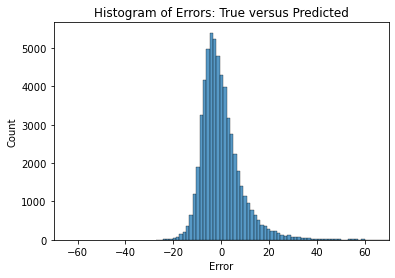

In [145]:
plt.figure()
sns.histplot((y_test - y_pred),bins=100)
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", round(reg_tts.score(X_test,y_test),2))

Seems like we need a different model. The poisson distribution is for non-negative count data with mean = variance. If the variance is much greater than the mean we should not use this. Let us look at the statistics of the num_variables data

In [146]:
mean = ing_df['num_ingredients'].mean()
variance = ing_df['num_ingredients'].var()
print("The mean and variance of the num ingredients variable is: {} and {}".format(mean, variance))

The mean and variance of the num ingredients variable is: 12.67525022901364 and 83.73231574544447


In [147]:
# reg_sgc = make_pipeline(StandardScaler(),
#                     SGDClassifier(loss ="log",max_iter=10**6/X_train.shape[0],tol=1e-3))
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.15, random_state=42)
# reg_sgc.fit(X_train,y_train)
# mean_accuracy = reg_sgc.score(X_train,y_train)
# print("mean accuracy: ", mean_accuracy)
# ypred = reg_sgc.predict(X_test)

# cm = metrics.confusion_matrix(y_test, ypred)
# print(cm)

# cr = metrics.classification_report(y_test, ypred)
# print(cr)

In [148]:
# reg_svc = make_pipeline(StandardScaler(),
#                     LinearSVC(random_state=42, tol=1e-5))
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.15, random_state=42)
# reg_svc.fit(X_train,y_train)
# mean_accuracy = reg_svc.score(X_train,y_train)
# print("mean accuracy: ", mean_accuracy)
# ypred = reg_svc.predict(X_test)

# cm = metrics.confusion_matrix(y_test, ypred)
# print(cm)

# cr = metrics.classification_report(y_test, ypred)
# print(cr)

In [149]:
# Deep learning: 
def nn(trainX,trainy,testX, testy, embed_size):
    # Defining the neural network
    """trains embedding taking in X as input, Y as output, embedding size and a listt of the unique y values"""
#     inp = Input(shape=(X.shape[1],))
#     x = Dense(units=embed_size, activation='relu')(inp)
#     x = Dense(units=1, activation='relu')(x)
#     model = Model(inputs=inp, outputs=x)
#     opt = SGD(lr=0.01, momentum=0.9)
#     model.compile(loss = 'mean_squared_error', optimizer = opt)

    
    model = Sequential()
    model.add(Dense(25, input_dim=trainX.shape[1], activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(1, activation='linear'))
    opt = SGD(lr=0.01, momentum=0.9)
    model.compile(loss='mean_squared_error', optimizer=opt)
    # fit model
    history = model.fit(trainX, trainy, validation_data=(testX, testy), epochs=100, verbose=0)
    # evaluate the model
    train_mse = model.evaluate(trainX, trainy, verbose=0)
    test_mse = model.evaluate(testX, testy, verbose=0)
    print('Train: %.3f, Test: %.3f' % (train_mse, test_mse))
    # plot loss during training
    plt.title('Loss / Mean Squared Error')
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    # Optimizing the network weights
#     model.fit(
#         x=X, 
#         y=Y, 
#         batch_size=256,
#         epochs=1000
#         )

#     weights = model.get_weights()[0]
#    return weights

In [150]:
print(X.shape)

(177937, 12)


In [151]:
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.15, random_state=42)

# nn(X_train,y_train[:,np.newaxis],X_test,y_test[:,np.newaxis],129)

MAE: 6.100062707705128
MSE: 70.43218596609528
RMSE: 8.392388573349978
R Squared: 0.1529676313114996


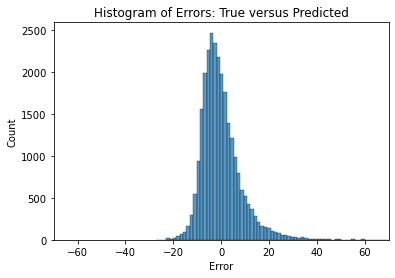

In [152]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.15, random_state=42)
reg_linear = make_pipeline(StandardScaler(),
                    LinearRegression())


reg_linear.fit(X_train, y_train)
y_pred = reg_linear.predict(X_test)
R_squared = reg_linear.score(X_test, y_test)

#error distribution
plt.figure()
sns.histplot((y_test - y_pred),bins=100)
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", R_squared)

In [153]:
#VIF measures the amount each variable is determined by the other variables.
X_vif = add_constant(X)
vif=pd.Series([variance_inflation_factor(X_vif.values, i) 
               for i in range(X_vif.shape[1])], 
              index=X_vif.columns)
print(vif)

/Users/sarahantiles/opt/anaconda3/envs/FoodEnv/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


const                                4.814821
1093Sodium, Na                       1.654309
2000Sugars, total including NLEA     2.235553
1008Energy                          24.580069
1257Fatty acids, total trans         1.036601
1087Calcium, Ca                      1.332728
1258Fatty acids, total saturated     3.099725
1003Protein                          3.233332
1079Fiber, total dietary             1.520927
1004Total lipid (fat)                7.894340
1253Cholesterol                      2.099241
1089Iron, Fe                         1.651251
1005Carbohydrate, by difference     11.352380
dtype: float64


In [154]:
vif_thresh = 5
vif_out_vars = vif.iloc[np.where(vif.values>=vif_thresh)].index.tolist()
#print(vif_out_vars[0])
vif_out_vars

['1008Energy', '1004Total lipid (fat)', '1005Carbohydrate, by difference']

The above high VIF scores (>5) shows that there is some multicollinearity. We will take out 1005,1004, 1008 and run again

In [155]:
lin_reg_vars = X_vif.columns.values.tolist()
for i in vif_out_vars:
    lin_reg_vars.remove(i)   

In [156]:
X_post_vif = X_vif[lin_reg_vars].copy()
vif=pd.Series([variance_inflation_factor(X_post_vif.values, i) 
               for i in range(X_post_vif.shape[1])], 
              index=X_post_vif.columns)
print(vif)

const                               4.491631
1093Sodium, Na                      1.491824
2000Sugars, total including NLEA    1.254364
1257Fatty acids, total trans        1.036373
1087Calcium, Ca                     1.311612
1258Fatty acids, total saturated    1.465898
1003Protein                         2.206225
1079Fiber, total dietary            1.408208
1253Cholesterol                     2.049747
1089Iron, Fe                        1.481309
dtype: float64


In [157]:
y.isna().sum()

0

mean residual: -0.0285716890175111
MAE: 6.201542030704465
MSE: 71.99088471627711
RMSE: 8.484744233992979
R Squared: 0.13422239039176043


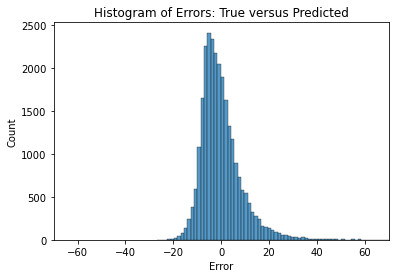

In [158]:
X_train, X_test, y_train, y_test = train_test_split(
    X_post_vif, y, test_size=0.15, random_state=42)
reg_linear = make_pipeline(StandardScaler(),
                    LinearRegression())


reg_linear.fit(X_train, y_train)
y_pred = reg_linear.predict(X_test)
residual = y_test - y_pred
R_squared = reg_linear.score(X_test, y_test)

#error distribution
plt.figure()
sns.histplot((residual),bins=100)
print("mean residual:", np.mean(residual))
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", R_squared)

Errors seem near normal since average error close to zero

Test for homoskedasticity:

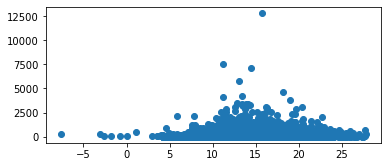

In [159]:
fig, ax = plt.subplots(figsize = (6,2.5))
_ = ax.scatter(y_pred, residual**2)

mean residual: 1.6078396578570078
MAE: 6.05122788110523
MSE: 74.81524527814184
RMSE: 8.649580641750319
R Squared: 0.10025603276801309


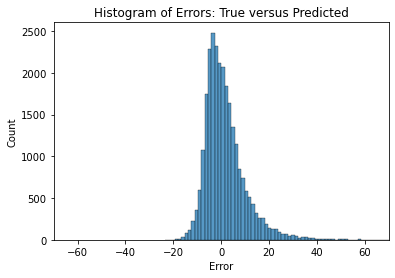

In [160]:
X_train, X_test, y_train, y_test = train_test_split(
    X_post_vif, y, test_size=0.15, random_state=42)
reg_svr = make_pipeline(StandardScaler(),
                    SVR(kernel='linear'))


reg_svr.fit(X_train, y_train)
y_pred = reg_svr.predict(X_test)
residual = y_test - y_pred
R_squared = reg_svr.score(X_test, y_test)

#error distribution
plt.figure()
sns.histplot((residual),bins=100)
print("mean residual:", np.mean(residual))
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", R_squared)

mean residual: -0.0285715782994761
MAE: 6.201542453522033
MSE: 71.99088478166085
RMSE: 8.484744237845998
R Squared: 0.10025603276801309


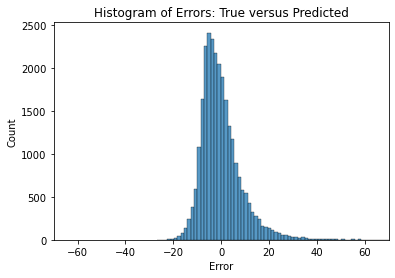

In [161]:
X_train, X_test, y_train, y_test = train_test_split(
    X_post_vif, y, test_size=0.15, random_state=42)
reg_ridge = make_pipeline(StandardScaler(),
                    Ridge())


reg_ridge.fit(X_train, y_train)
y_pred = reg_ridge.predict(X_test)
residual = y_test - y_pred
R_squared = reg_svr.score(X_test, y_test)

#error distribution
plt.figure()
sns.histplot((residual),bins=100)
print("mean residual:", np.mean(residual))
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", R_squared)

mean residual: 1.1954693771876903
MAE: 5.114658307106578
MSE: 58.40036071703598
RMSE: 7.642012870771416
R Squared: 0.2976649071459132


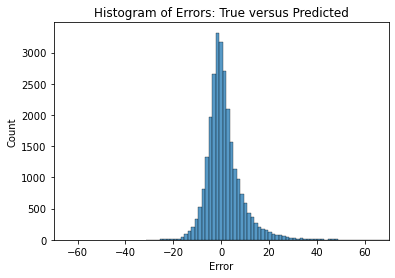

In [164]:
X_train, X_test, y_train, y_test = train_test_split(
    X_post_vif, y, test_size=0.15, random_state=42)
reg_svr = make_pipeline(StandardScaler(),
                    SVR(kernel='rbf'))


reg_svr.fit(X_train, y_train)
y_pred = reg_svr.predict(X_test)
residual = y_test - y_pred
R_squared = reg_svr.score(X_test, y_test)

#error distribution
plt.figure()
sns.histplot((residual),bins=100)
print("mean residual:", np.mean(residual))
print("MAE:", metrics.mean_absolute_error(y_test,y_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
plt.title("Histogram of Errors: True versus Predicted")
plt.xlabel("Error")
plt.ylabel("Count")
plt.xlim(-70,70)
print("R Squared:", R_squared)

In [163]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.2976649071459132